In [7]:
# !pip install torchinfo
import torch
import torch.nn as nn
from torchinfo import summary
import matplotlib.pyplot as plt
import os
import gc
# os.environ['OPENBLAS_NUM_THREADS'] = '1'
import numpy as np
import time
import TrainerVTS_V08F3_RGB  as TP
import Datasetting.DataOrganizer_old as DS

# Teacher Train

In [2]:
date = '2024_Door_RGB/Alpha/'
name = f'{date}Prop_TrainA308T'
data_path = [
    '../dataset/Door_EXP/A308T',
            ]
level = 'env'

crossvalidator = DS.CrossValidator(level, all_range=[None])
data_organizer = DS.DataOrganizer(name, data_path, crossvalidator)
data_organizer.load()

Cross validation plan at env level
Loading ../dataset/Door_EXP/A208...

Loaded 0709A00-csi.npy
Loaded 0709A00-pd.npy
Loaded 0709A01-csi.npy
Loaded 0709A01-pd.npy
Loaded 0709A02-csi.npy
Loaded 0709A02-pd.npy
Loaded 0709A03-csi.npy
Loaded 0709A03-pd.npy
Loaded 0709A04-csi.npy
Loaded 0709A04-pd.npy
Loaded 0709A10-csi.npy
Loaded 0709A10-pd.npy
Loaded 0709A11-csi.npy
Loaded 0709A11-pd.npy
Loaded 0709A12-csi.npy
Loaded 0709A12-pd.npy
Loaded 0709A13-csi.npy
Loaded 0709A13-pd.npy
Loaded 0709A14-csi.npy
Loaded 0709A14-pd.npy
Loaded 0709A20-csi.npy
Loaded 0709A20-pd.npy
Loaded 0709A21-csi.npy
Loaded 0709A21-pd.npy
Loaded 0709A22-csi.npy
Loaded 0709A22-pd.npy
Loaded 0709A23-csi.npy
Loaded 0709A23-pd.npy
Loaded 0709A24-csi.npy
Loaded 0709A24-pd.npy
Loaded 0709A30-csi.npy
Loaded 0709A30-pd.npy
Loaded 0709A31-csi.npy
Loaded 0709A31-pd.npy
Loaded 0709A32-csi.npy
Loaded 0709A32-pd.npy
Loaded 0709A33-csi.npy
Loaded 0709A33-pd.npy
Loaded 0709A34-csi.npy
Loaded 0709A34-pd.npy
Loaded 0709A40-csi.npy
Loade

In [5]:
data_organizer.cross_validator.subset_ratio = 0.2
data_organizer.cross_validator.all_range = [None]
data_organizer.save_plan(notion='source')
data_organizer.gen_plan()
train_loader, valid_loader, test_loader, current_test = data_organizer.gen_loaders(mode='t', num_workers=2)

Data Organizer: Saving plan env @ 0.2...
Plan saved!
Data Organizer: Data iterator reset!
Cross-validator: Fetched level env, 1 of 1, current test = None
 Select set range = [], len = 8682 from 43412
 Leave set range = None, len = 0 from 0
Data Organizer: Generating loaders for t: current test = None
 Train/Valid dataset length = 8682
 Test dataset length = 0
 Exported train loader of len 108, batch size = 64

 Exported valid loader of len 27, batch size = 64

 None test loader


In [8]:
preprocess = DS.Preprocess(new_size=(128, 128))
gpu = 3
torch.cuda.set_device(gpu)
T_trainer = TP.TeacherTrainer(name='Teacher',
                              epochs=10, cuda=gpu,
                              preprocess = preprocess,
                              notion=f'{name}',
                              dataloaders={
                                  'train': train_loader,
                                  'valid': valid_loader,
                                  'test': test_loader
                              }
                             )
T_trainer.training_phases['main'].lr = 1.e-4
# T_trainer.models['rimgde'] = TP.initialize_weights(T_trainer.models['rimgde'])
# T_trainer.models['cimgde'] = TP.initialize_weights(T_trainer.models['cimgde'])
T_trainer.schedule(lr_decay=True)

==========2025-03-03 11:25:03 2024_Door_RGB/Prop/Prop_TrainA308T Teacher Training starting==========


  0%|                                                                                                         …

  0%|                                                                                                         …

main imgen cnn.0.weight: requires_grad=True
main imgen cnn.0.bias: requires_grad=True
main imgen cnn.3.weight: requires_grad=True
main imgen cnn.3.bias: requires_grad=True
main imgen cnn.6.weight: requires_grad=True
main imgen cnn.6.bias: requires_grad=True
main imgen cnn.9.weight: requires_grad=True
main imgen cnn.9.bias: requires_grad=True
main imgen cnn.12.weight: requires_grad=True
main imgen cnn.12.bias: requires_grad=True
main imgen cnn.15.weight: requires_grad=True
main imgen cnn.15.bias: requires_grad=True
main imgen cnn.18.weight: requires_grad=True
main imgen cnn.18.bias: requires_grad=True
main imgen cnn.21.weight: requires_grad=True
main imgen cnn.21.bias: requires_grad=True
main imgen cnn.22.weight: requires_grad=True
main imgen cnn.22.bias: requires_grad=True
main imgen fc_mu.0.weight: requires_grad=True
main imgen fc_mu.0.bias: requires_grad=True
main imgen fc_logvar.0.weight: requires_grad=True
main imgen fc_logvar.0.bias: requires_grad=True
main cimgde cnn.0.weight: re

RuntimeError: torch.nn.functional.binary_cross_entropy and torch.nn.BCELoss are unsafe to autocast.
Many models use a sigmoid layer right before the binary cross entropy layer.
In this case, combine the two layers using torch.nn.functional.binary_cross_entropy_with_logits
or torch.nn.BCEWithLogitsLoss.  binary_cross_entropy_with_logits and BCEWithLogits are
safe to autocast.

# Source Train

In [2]:
date = '2024_Door_RGB/Prop/'
name = f'{date}Prop_TrainA308T'
data_path = [
    '../dataset/Door_EXP/A308T',
            ]
level = 'env'

crossvalidator = DS.CrossValidator(level, all_range=[None])
data_organizer = DS.DataOrganizer(name, data_path, crossvalidator)
data_organizer.load()

Cross validation plan at env level
Loading ../dataset/Door_EXP/A308T...

Loaded 0731D00-csi.npy
Loaded 0731D00-pd.npy
Loaded 0731D10-csi.npy
Loaded 0731D10-pd.npy
Loaded 0731D20-csi.npy
Loaded 0731D20-pd.npy
Loaded 0731D21-csi.npy
Loaded 0731D21-pd.npy
Loaded 0731D30-csi.npy
Loaded 0731D30-pd.npy
Loaded 0731D40-csi.npy
Loaded 0731D40-pd.npy
Loaded 0731D50-csi.npy
Loaded 0731D50-pd.npy
Loaded 20240731_131758-cimg.npy
Loaded 20240731_131758-ctr.npy
Loaded 20240731_131758-dpt.npy
Loaded 20240731_131758-rimg.npy
Loaded 20240731_132041-cimg.npy
Loaded 20240731_132041-ctr.npy
Loaded 20240731_132041-dpt.npy
Loaded 20240731_132041-rimg.npy
Loaded 20240731_132526-cimg.npy
Loaded 20240731_132526-ctr.npy
Loaded 20240731_132526-dpt.npy
Loaded 20240731_132526-rimg.npy
Loaded 20240731_132913-cimg.npy
Loaded 20240731_132913-ctr.npy
Loaded 20240731_132913-dpt.npy
Loaded 20240731_132913-rimg.npy
Loaded 20240731_134148-cimg.npy
Loaded 20240731_134148-ctr.npy
Loaded 20240731_134148-dpt.npy
Loaded 2024073

In [3]:
data_organizer.cross_validator.subset_ratio = 0.2
data_organizer.cross_validator.all_range = [None]
data_organizer.reset_plan()
data_organizer.gen_plan()
train_loader, valid_loader, test_loader, current_test = data_organizer.gen_loaders(mode='s', num_workers=2)

Data Organizer: Data iterator reset!
Cross-validator: Fetched level env, 1 of 1, current test = None
 Select set range = [], len = 8682 from 43412
 Leave set range = None, len = 0 from 0
Data Organizer: Generating loaders for s: current test = None
 Train/Valid dataset length = 8682
 Test dataset length = 0
 Exported train loader of len 108, batch size = 64

 Exported valid loader of len 27, batch size = 64

 None test loader


In [6]:
preprocess = DS.Preprocess(new_size=(128, 128))
gpu = 3
torch.cuda.set_device(gpu)
S_trainer = TP.StudentTrainer(name='Student',
                              epochs=10, cuda=gpu,
                              preprocess = preprocess,
                              notion=f'{name}',
                              dataloaders={
                                  'train': train_loader,
                                  'valid': valid_loader,
                                  'test': test_loader
                              }
                             )
S_trainer.img_weight = 1.e-4
S_trainer.load(f"../saved/2024_Door_RGB/Mod/Prop_TrainA208/", name='Teacher', mode='best')
S_trainer.schedule(lr_decay=True)

==========2024_Door_RGB/Mod/Prop_TrainA208 Student Loading==========
Loading ../saved/2024_Door_RGB/Mod/Prop_TrainA208/
Loaded model imgen at epoch 149 from ../saved/2024_Door_RGB/Mod/Prop_TrainA208/Teacher_models_imgen_best.pth!
Loaded model cimgde at epoch 149 from ../saved/2024_Door_RGB/Mod/Prop_TrainA208/Teacher_models_cimgde_best.pth!
Loaded model rimgde at epoch 149 from ../saved/2024_Door_RGB/Mod/Prop_TrainA208/Teacher_models_rimgde_best.pth!
Loaded model ctrde at epoch 149 from ../saved/2024_Door_RGB/Mod/Prop_TrainA208/Teacher_models_ctrde_best.pth!
==========2025-02-23 14:03:22 2024_Door_RGB/Mod/Prop_TrainA208 Student Training starting==========


  0%|                                                                                                         …

  0%|                                                                                                         …

KeyError: 'csi'

# Target Train

In [3]:
date = '2024_Door_RGB/Prop/'
name = f'{date}Prop_TrainA208TargetA308'
data_path = [
    '../dataset/Door_EXP/A208',
    '../dataset/Door_EXP/A308T'
            ]
level = 'env'

crossvalidator = DS.CrossValidator(level, all_range=['A208', 'A308T'], subset_ratio=0.2)
data_organizer = DS.DataOrganizer(name, data_path, crossvalidator)
data_organizer.load()

Cross validation plan at env level
Loading ../dataset/Door_EXP/A208...

Loaded 0709A00-csi.npy
Loaded 0709A00-pd.npy
Loaded 0709A01-csi.npy
Loaded 0709A01-pd.npy
Loaded 0709A02-csi.npy
Loaded 0709A02-pd.npy
Loaded 0709A03-csi.npy
Loaded 0709A03-pd.npy
Loaded 0709A04-csi.npy
Loaded 0709A04-pd.npy
Loaded 0709A10-csi.npy
Loaded 0709A10-pd.npy
Loaded 0709A11-csi.npy
Loaded 0709A11-pd.npy
Loaded 0709A12-csi.npy
Loaded 0709A12-pd.npy
Loaded 0709A13-csi.npy
Loaded 0709A13-pd.npy
Loaded 0709A14-csi.npy
Loaded 0709A14-pd.npy
Loaded 0709A20-csi.npy
Loaded 0709A20-pd.npy
Loaded 0709A21-csi.npy
Loaded 0709A21-pd.npy
Loaded 0709A22-csi.npy
Loaded 0709A22-pd.npy
Loaded 0709A23-csi.npy
Loaded 0709A23-pd.npy
Loaded 0709A24-csi.npy
Loaded 0709A24-pd.npy
Loaded 0709A30-csi.npy
Loaded 0709A30-pd.npy
Loaded 0709A31-csi.npy
Loaded 0709A31-pd.npy
Loaded 0709A32-csi.npy
Loaded 0709A32-pd.npy
Loaded 0709A33-csi.npy
Loaded 0709A33-pd.npy
Loaded 0709A34-csi.npy
Loaded 0709A34-pd.npy
Loaded 0709A40-csi.npy
Loade

In [4]:
data_organizer.load_plan('../dataset/Door_EXP/env_r0.2_None_1source.pkl')
data_organizer.gen_plan(
    # save=True, notion='_1source'
)

target_train_loader, target_valid_loader, source_test_loader, current_test = data_organizer.gen_loaders(num_workers=2)

data_organizer.gen_plan()
source_train_loader, source_valid_loader, target_test_loader, current_test = data_organizer.gen_loaders(num_workers=2)
dann_train_loader = DS.DANN_Loader(source_train_loader, target_train_loader, source_rate=1, target_guide=False)

Data Organizer: Loaded plan!
Data Organizer: Generating loaders for s: current test = A208
 Train/Valid dataset length = 8682
 Test dataset length = 9910
 Exported train loader of len 108, batch size = 64

 Exported valid loader of len 27, batch size = 64

 Exported test loader of len 154, batch size = 64

Data Organizer: Generating loaders for s: current test = A308T
 Train/Valid dataset length = 9915
 Test dataset length = 8682
 Exported train loader of len 123, batch size = 64

 Exported valid loader of len 30, batch size = 64

 Exported test loader of len 135, batch size = 64



==========2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T Student Loading==========
Loading ../saved/2024_Door_RGB/Prop/Prop_TrainA208_None_4/
Loaded model imgen at epoch 178 from ../saved/2024_Door_RGB/Prop/Prop_TrainA208_None_4/Student_models_imgen_best.pth!
Loaded model cimgde at epoch 178 from ../saved/2024_Door_RGB/Prop/Prop_TrainA208_None_4/Student_models_cimgde_best.pth!
Loaded model rimgde at epoch 178 from ../saved/2024_Door_RGB/Prop/Prop_TrainA208_None_4/Student_models_rimgde_best.pth!
Loaded model ctrde at epoch 178 from ../saved/2024_Door_RGB/Prop/Prop_TrainA208_None_4/Student_models_ctrde_best.pth!
Loaded model csien at epoch 178 from ../saved/2024_Door_RGB/Prop/Prop_TrainA208_None_4/Student_models_csien_best.pth!
==========2025-02-19 17:13:04 2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T Student Training starting==========


  0%|                                                                                                         …

  0%|                                                                                                         …

main csien cnn.0.weight: requires_grad=True
main csien cnn.0.bias: requires_grad=True
main csien cnn.3.weight: requires_grad=True
main csien cnn.3.bias: requires_grad=True
main csien cnn.6.weight: requires_grad=True
main csien cnn.6.bias: requires_grad=True
main csien lstm.weight_ih_l0: requires_grad=True
main csien lstm.weight_hh_l0: requires_grad=True
main csien lstm.bias_ih_l0: requires_grad=True
main csien lstm.bias_hh_l0: requires_grad=True
main csien lstm.weight_ih_l1: requires_grad=True
main csien lstm.weight_hh_l1: requires_grad=True
main csien lstm.bias_ih_l1: requires_grad=True
main csien lstm.bias_hh_l1: requires_grad=True
main csien fc_feature.0.weight: requires_grad=True
main csien fc_feature.0.bias: requires_grad=True
main csien fc_pd.0.weight: requires_grad=True
main csien fc_pd.0.bias: requires_grad=True
main csien fc_mu.0.weight: requires_grad=True
main csien fc_mu.0.bias: requires_grad=True
main csien fc_logvar.0.weight: requires_grad=True
main csien fc_logvar.0.bias:

/home/caog/anaconda3/envs/cao/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([64, 2])) that is different to the input size (torch.Size([64, 1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/caog/anaconda3/envs/cao/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 640x480 with 0 Axes>

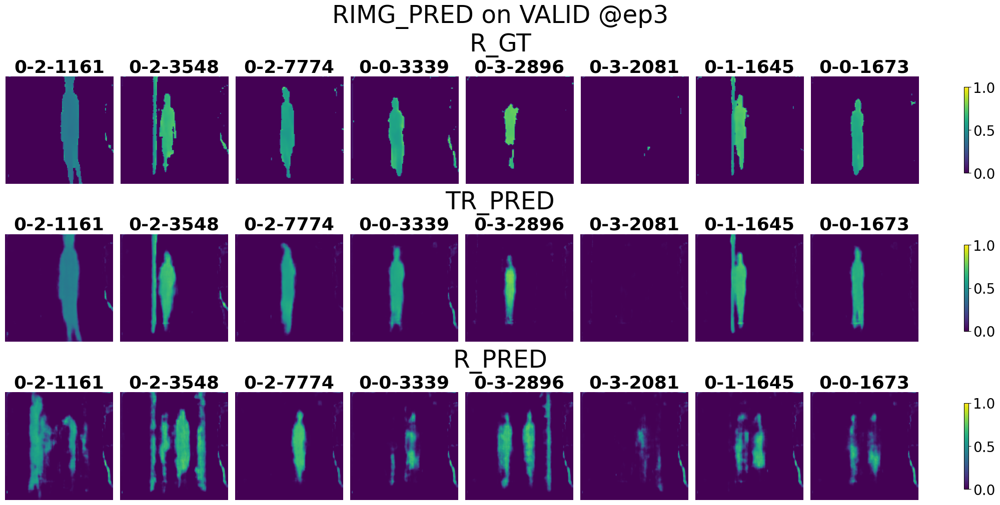

<Figure size 2000x1000 with 0 Axes>

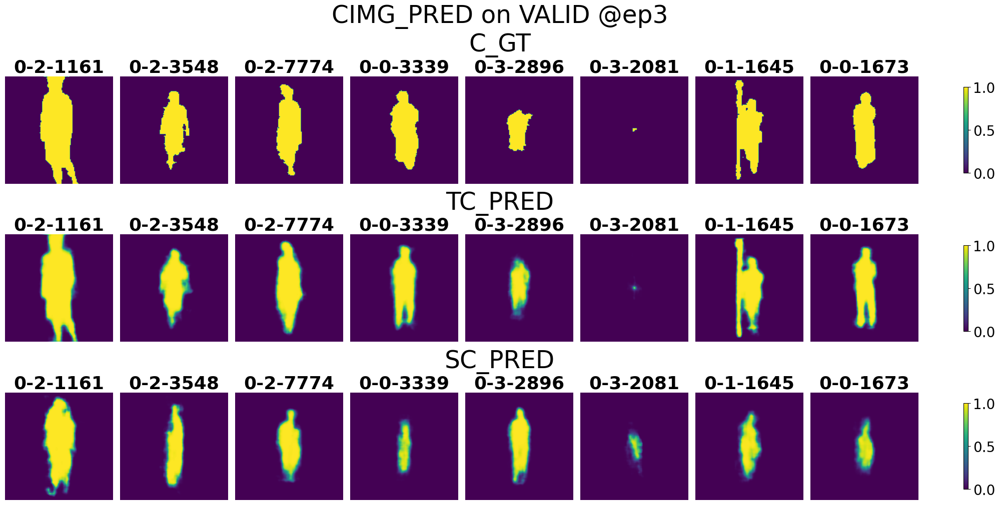

<Figure size 2000x1000 with 0 Axes>

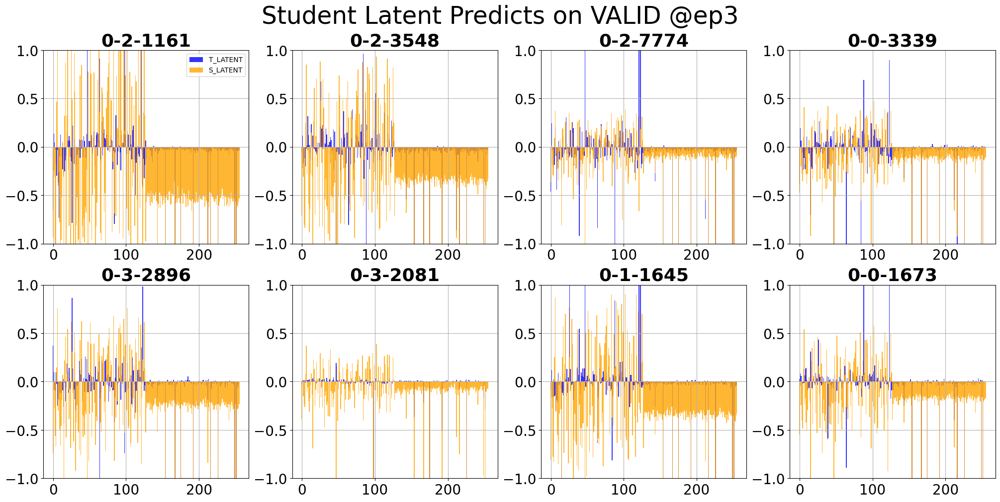

<Figure size 2000x1000 with 0 Axes>

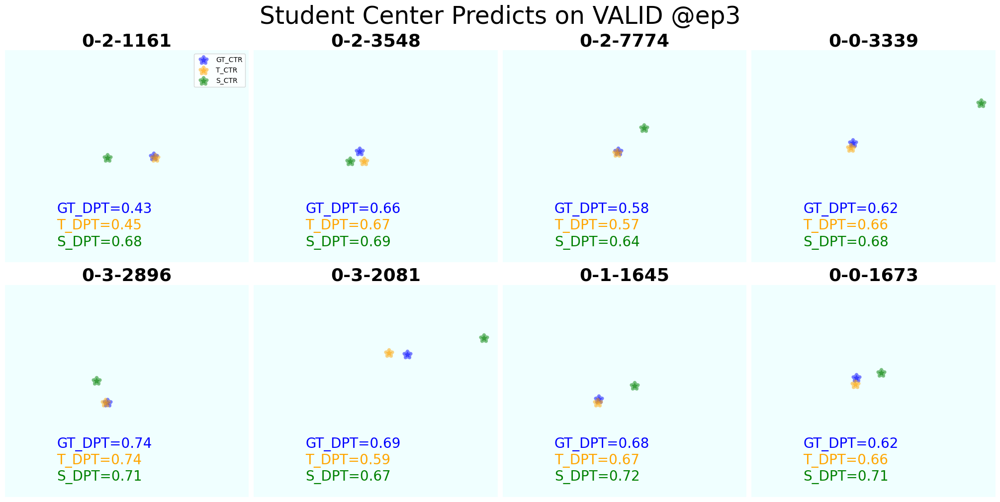

/media/mnthl/other/caog/datastore/Models/Loss.py:246: RuntimeWarning: invalid value encountered in true_divide
  cdf = np.cumsum(hist / sum(hist))
/media/mnthl/other/caog/datastore/Models/Loss.py:248: RuntimeWarning: invalid value encountered in true_divide
  axes[i].bar(bin_edges[1:], hist / max(hist), width=width, color='blue')


<Figure size 2000x1000 with 0 Axes>

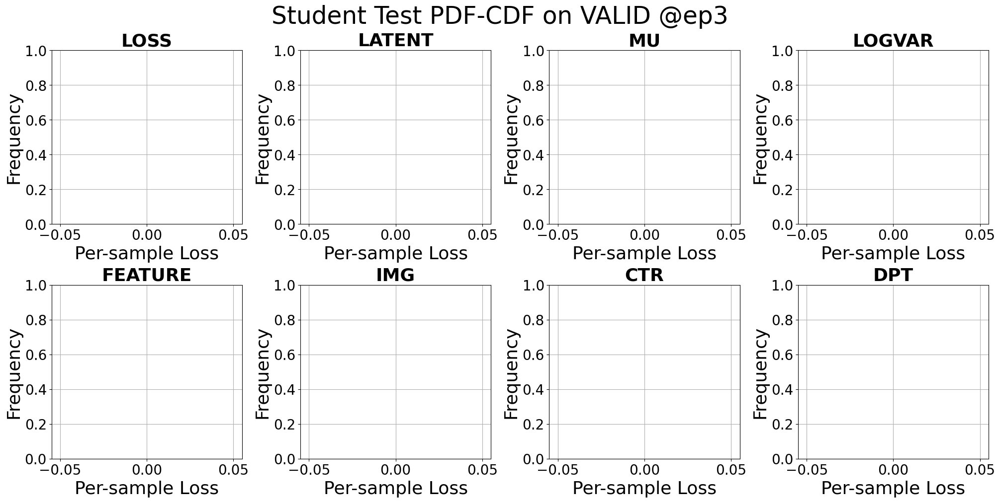

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

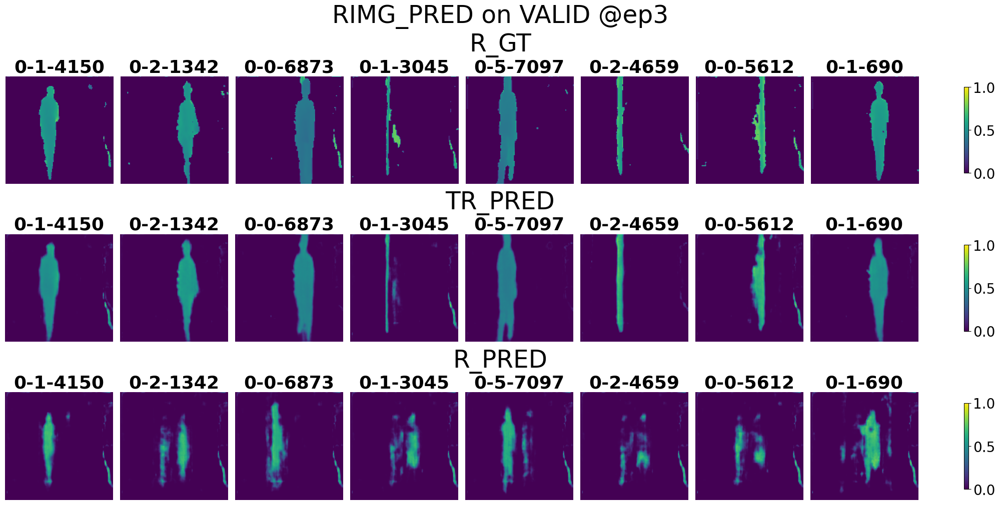

<Figure size 2000x1000 with 0 Axes>

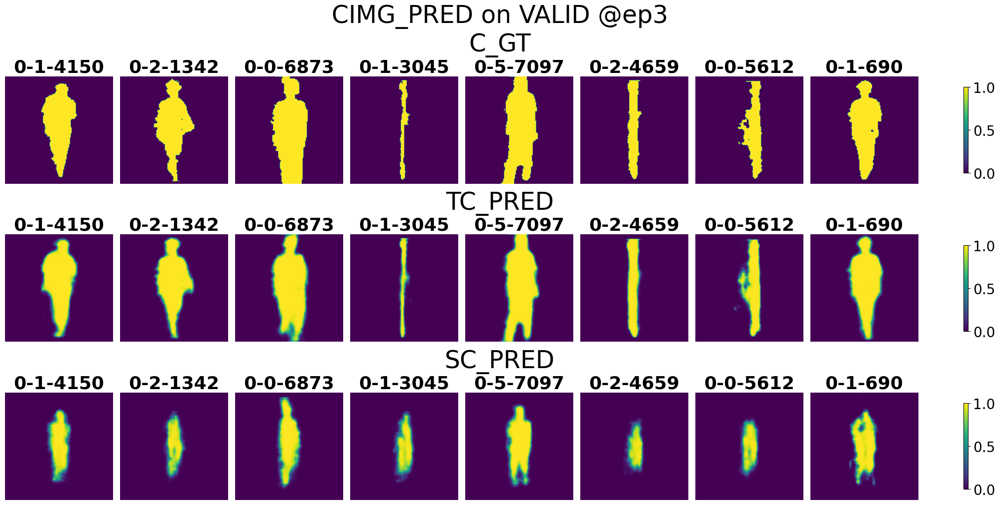

<Figure size 2000x1000 with 0 Axes>

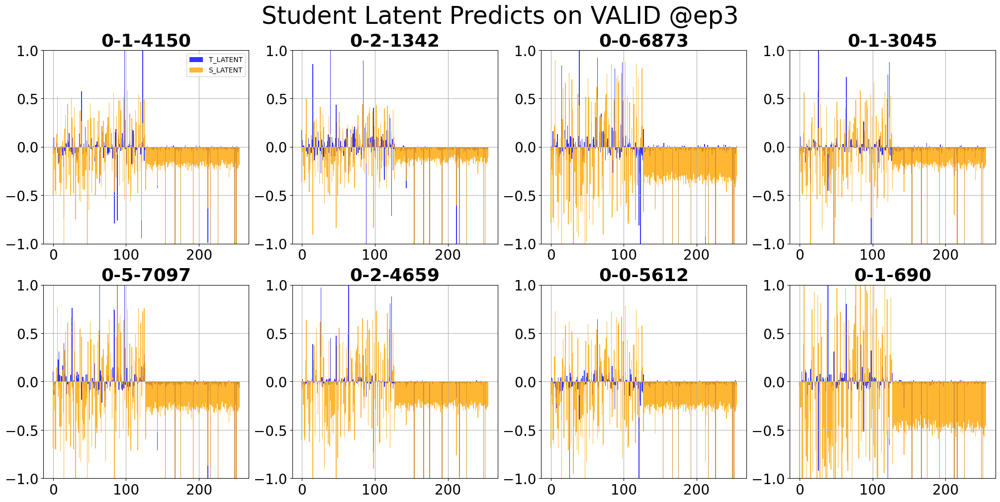

<Figure size 2000x1000 with 0 Axes>

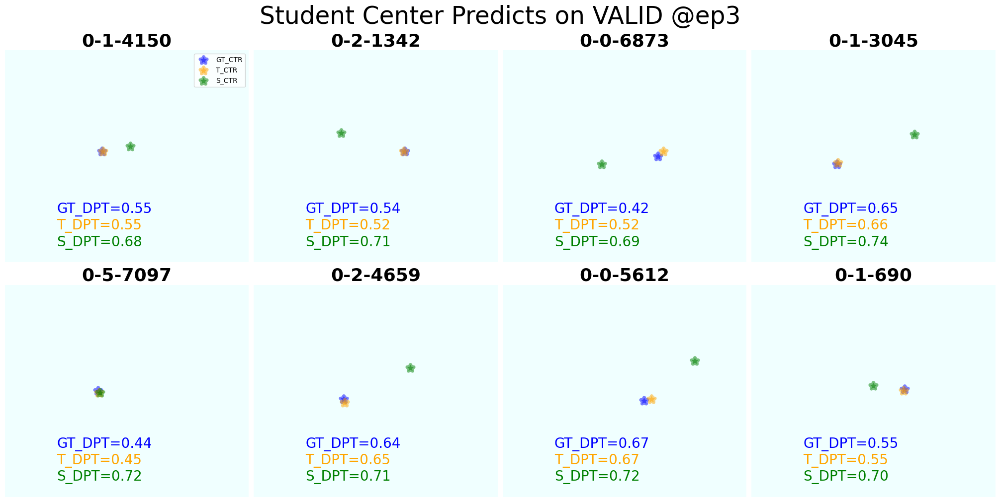

<Figure size 2000x1000 with 0 Axes>

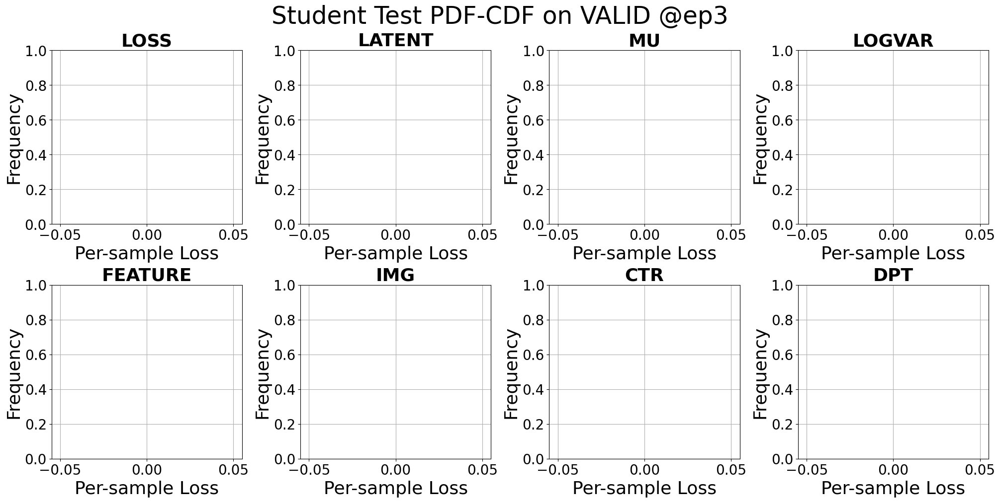

<Figure size 2000x1000 with 0 Axes>

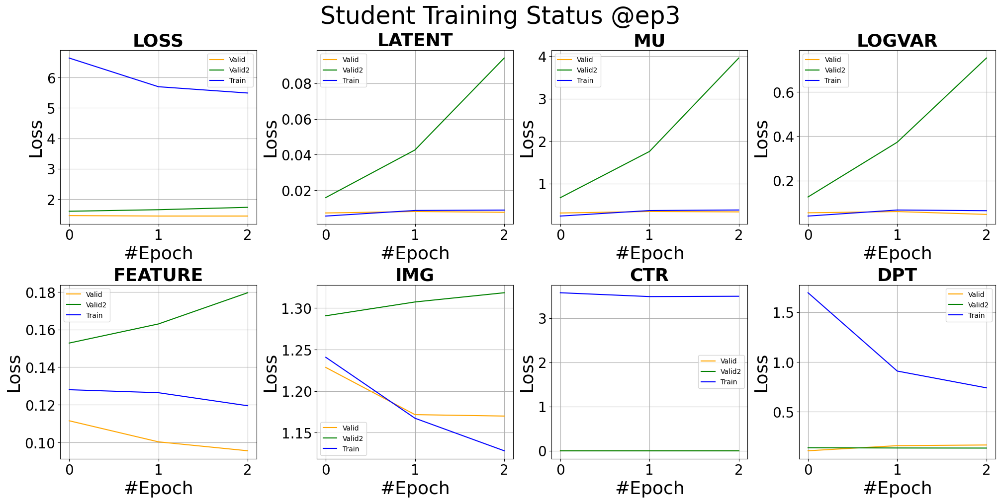

Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 7 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 8 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 9 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 10 out of 10
Lr decay reporting: 1 out of 5. Decay rate = 0.5



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

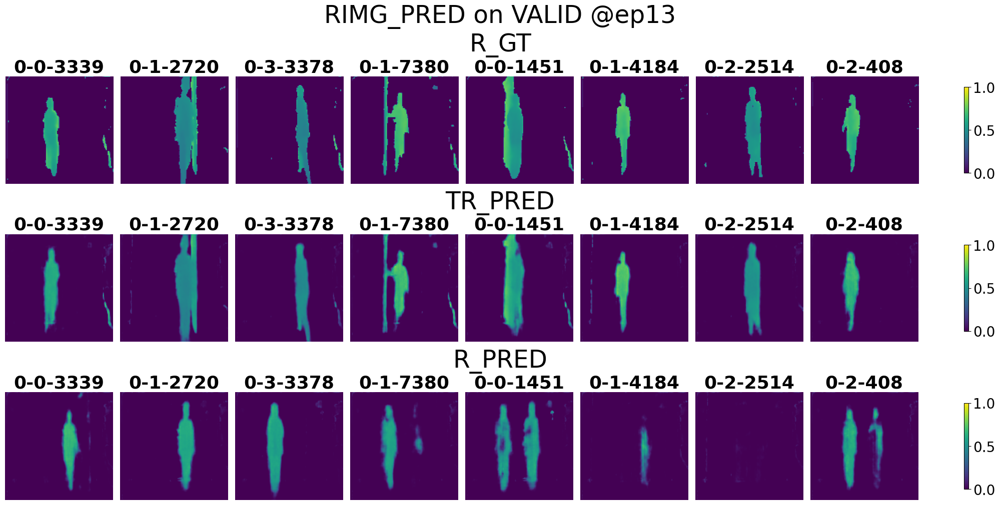

<Figure size 2000x1000 with 0 Axes>

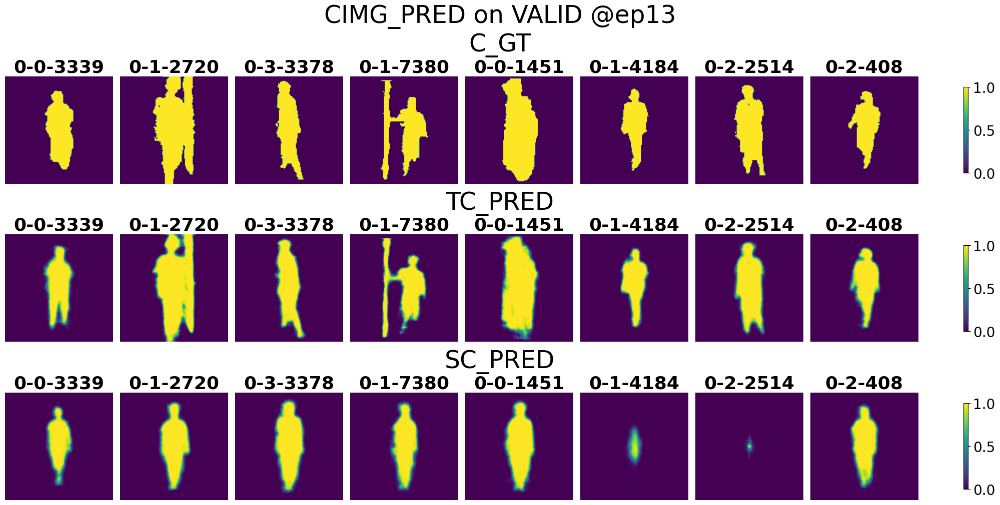

<Figure size 2000x1000 with 0 Axes>

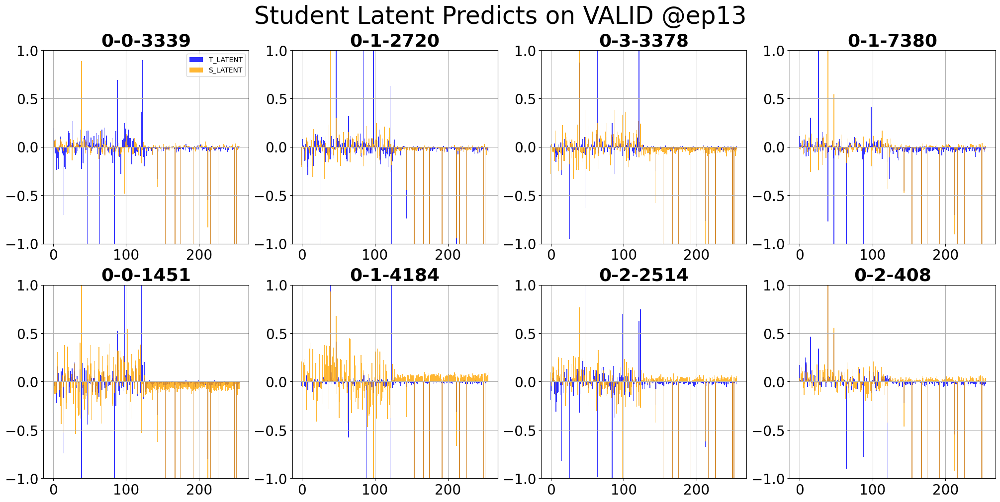

<Figure size 2000x1000 with 0 Axes>

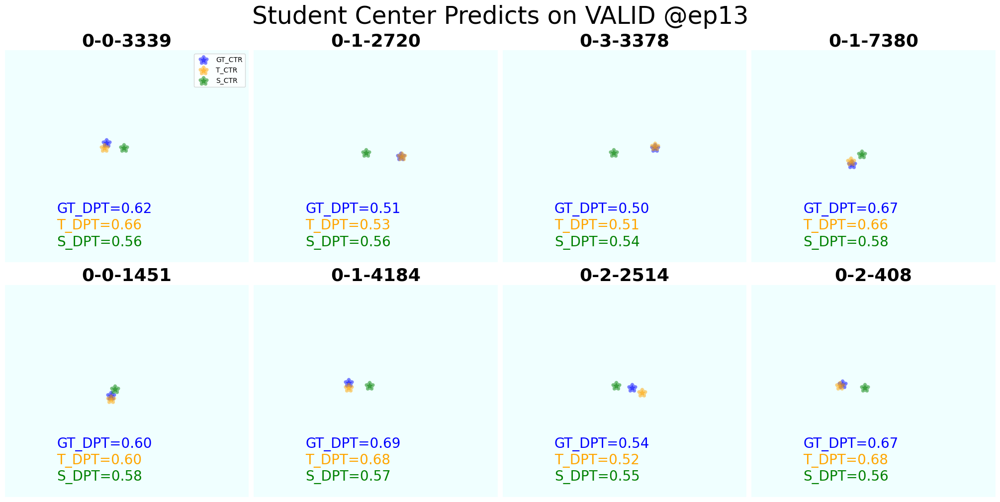

<Figure size 2000x1000 with 0 Axes>

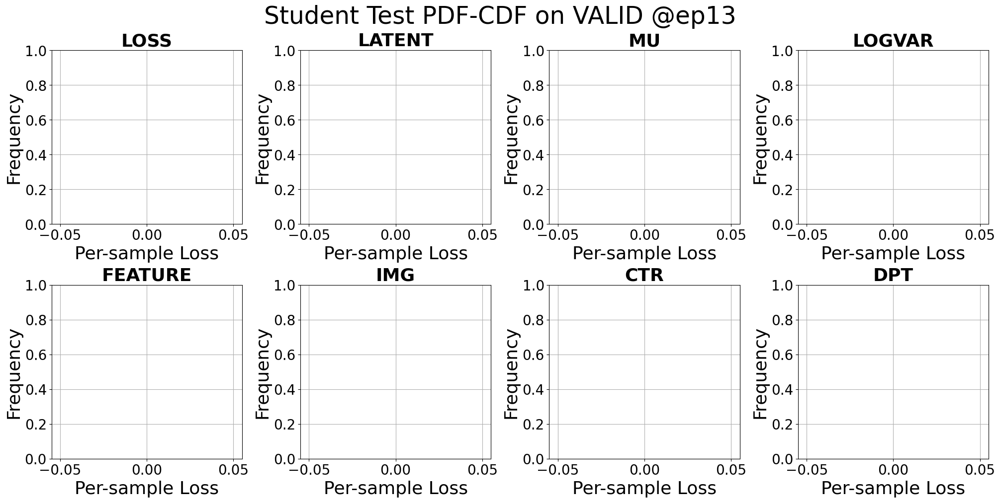

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

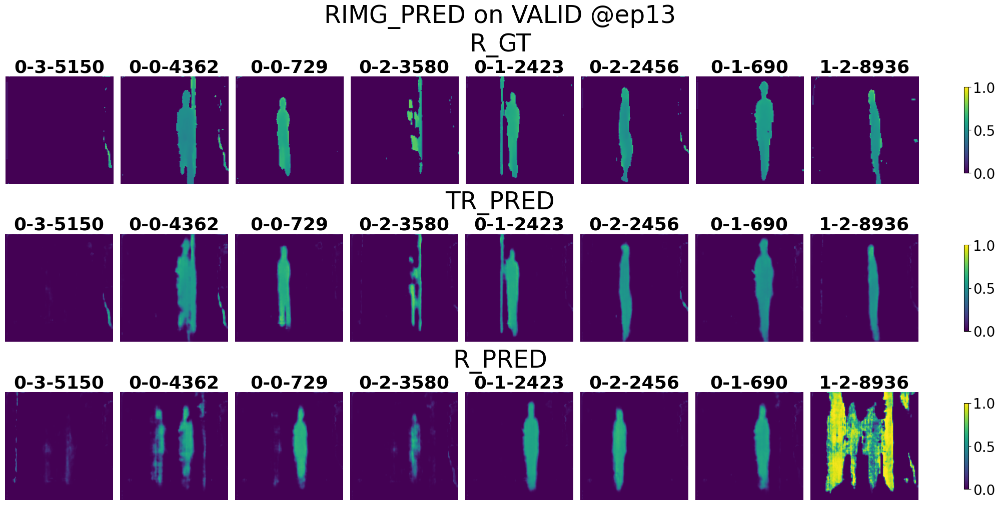

<Figure size 2000x1000 with 0 Axes>

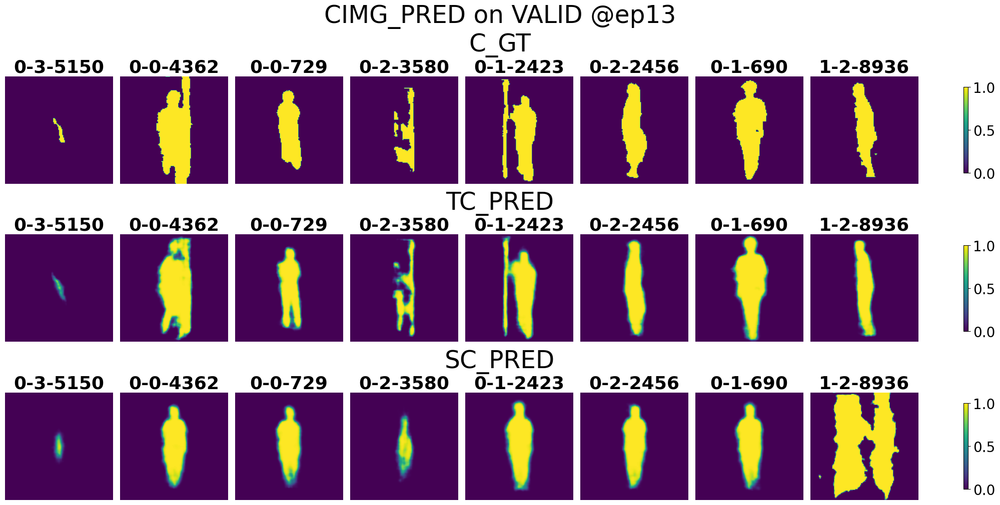

<Figure size 2000x1000 with 0 Axes>

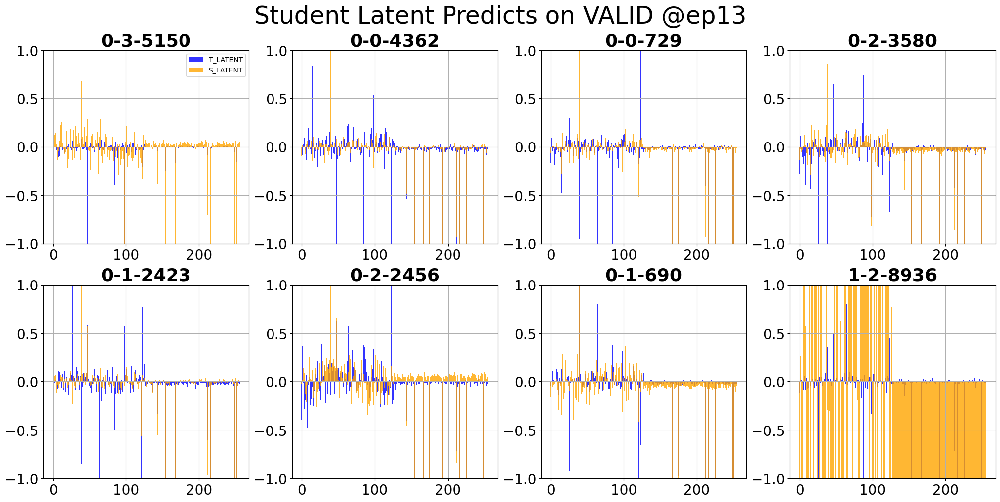

<Figure size 2000x1000 with 0 Axes>

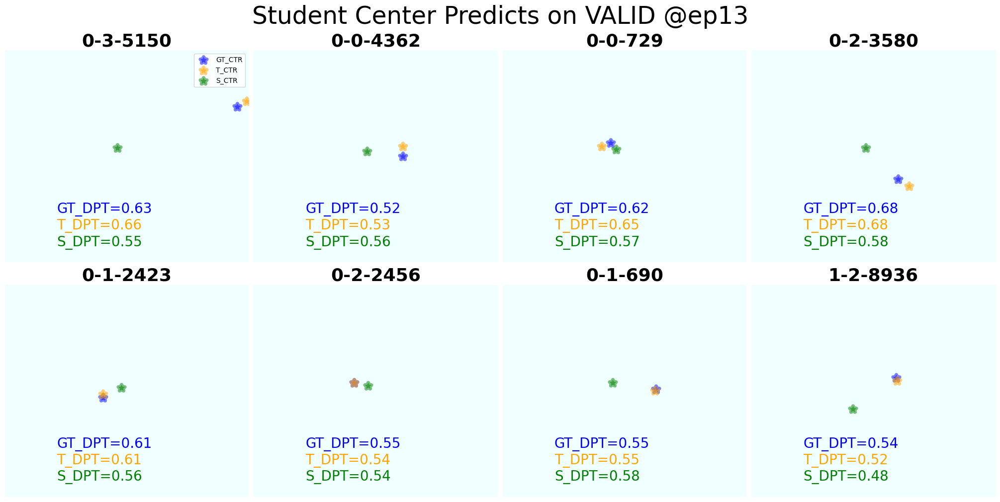

<Figure size 2000x1000 with 0 Axes>

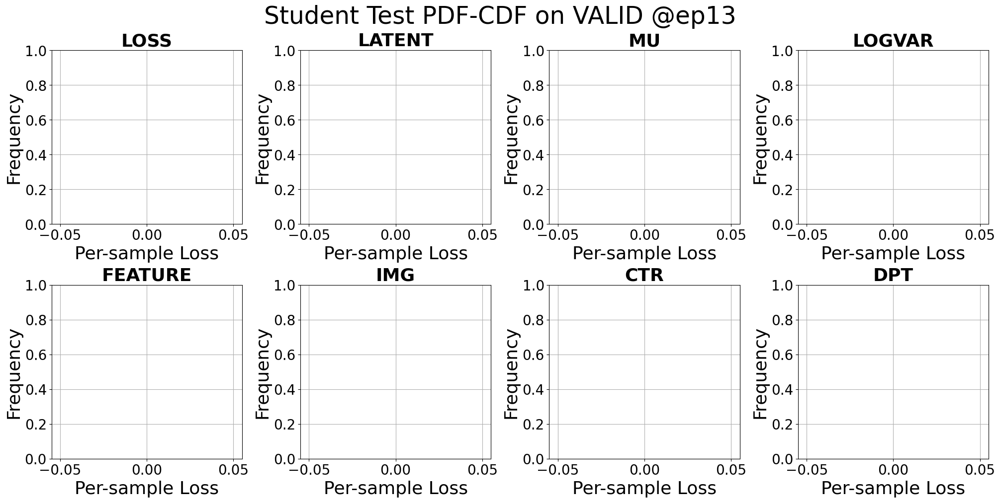

<Figure size 2000x1000 with 0 Axes>

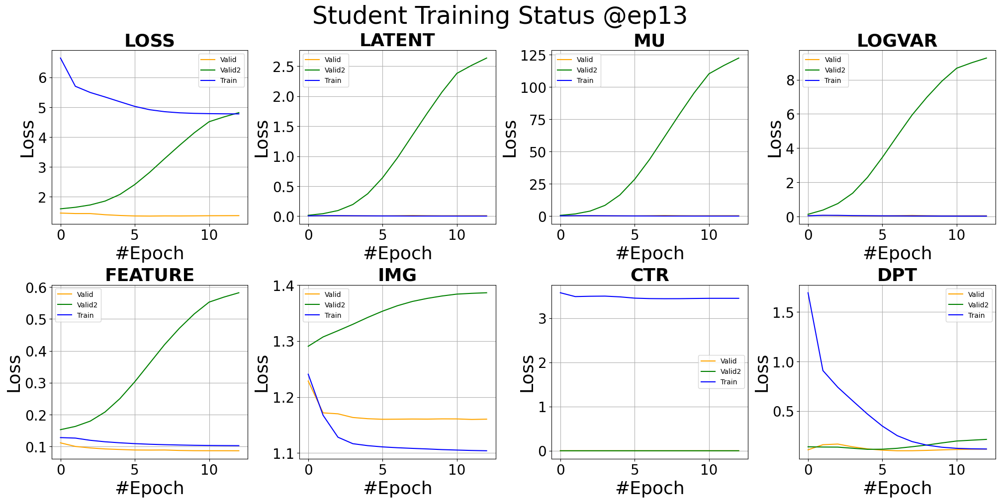

Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 7 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 8 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 9 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 10 out of 10
Lr decay reporting: 2 out of 5. Decay rate = 0.25



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

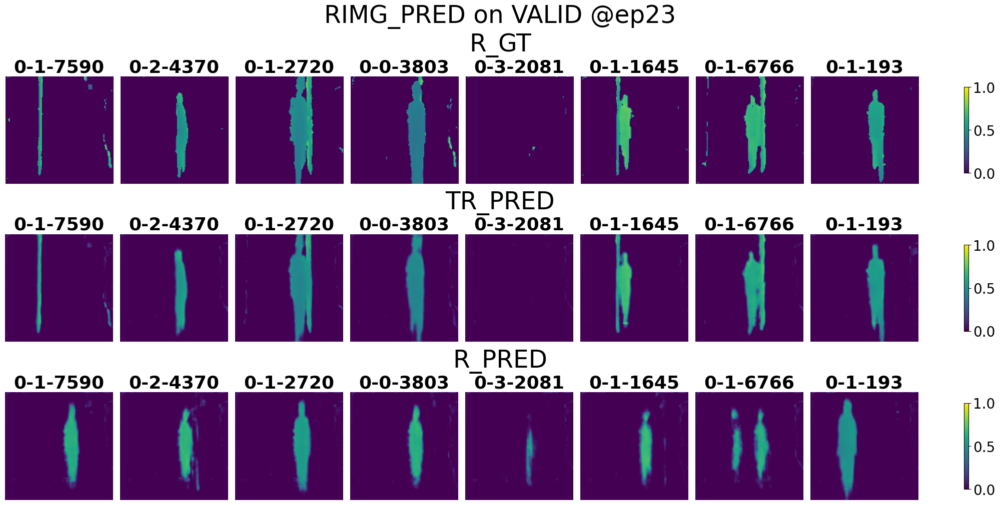

<Figure size 2000x1000 with 0 Axes>

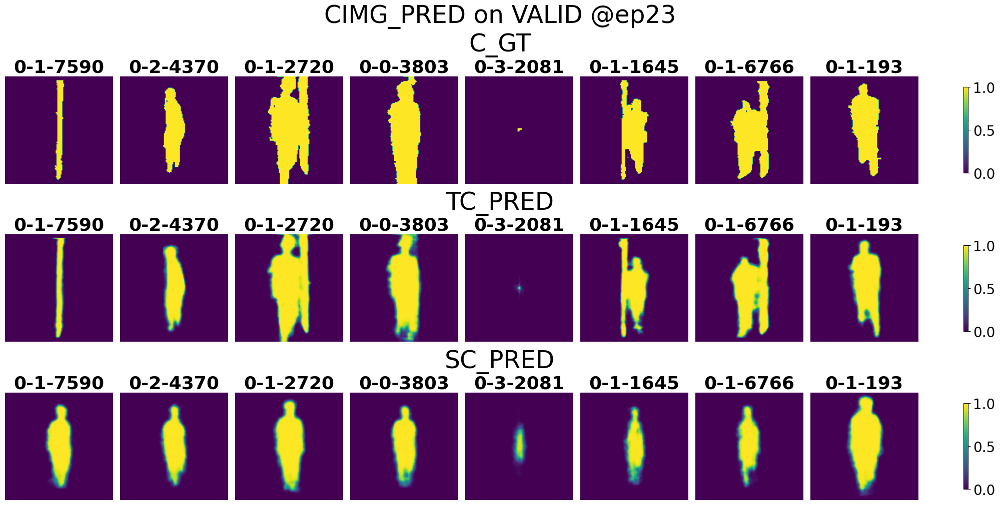

<Figure size 2000x1000 with 0 Axes>

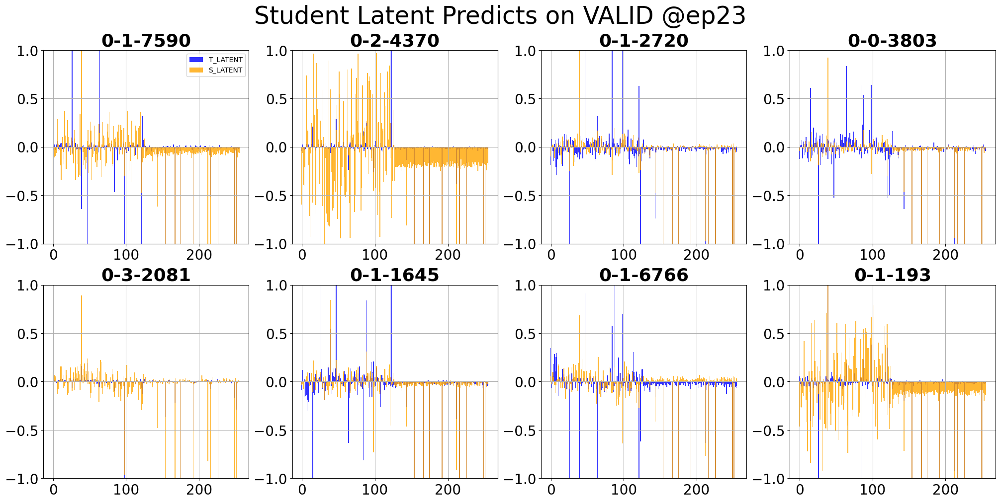

<Figure size 2000x1000 with 0 Axes>

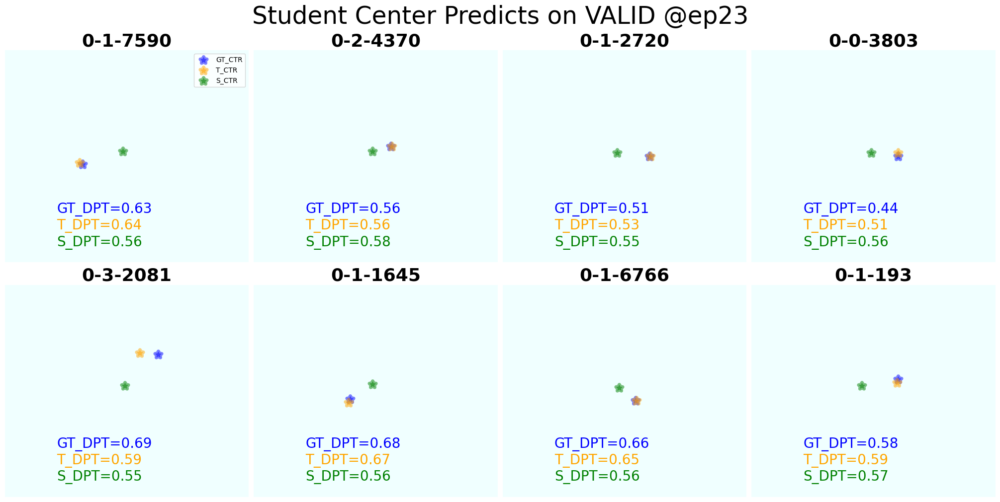

<Figure size 2000x1000 with 0 Axes>

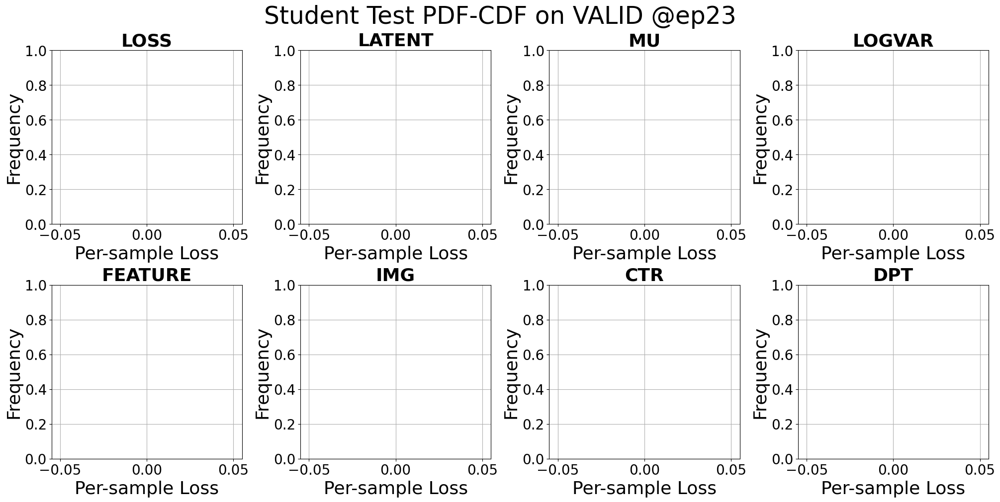

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

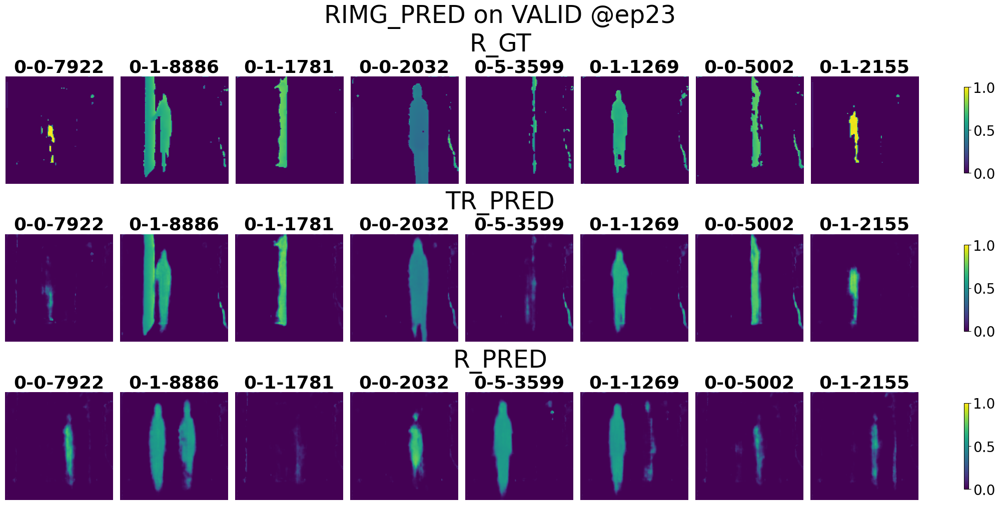

<Figure size 2000x1000 with 0 Axes>

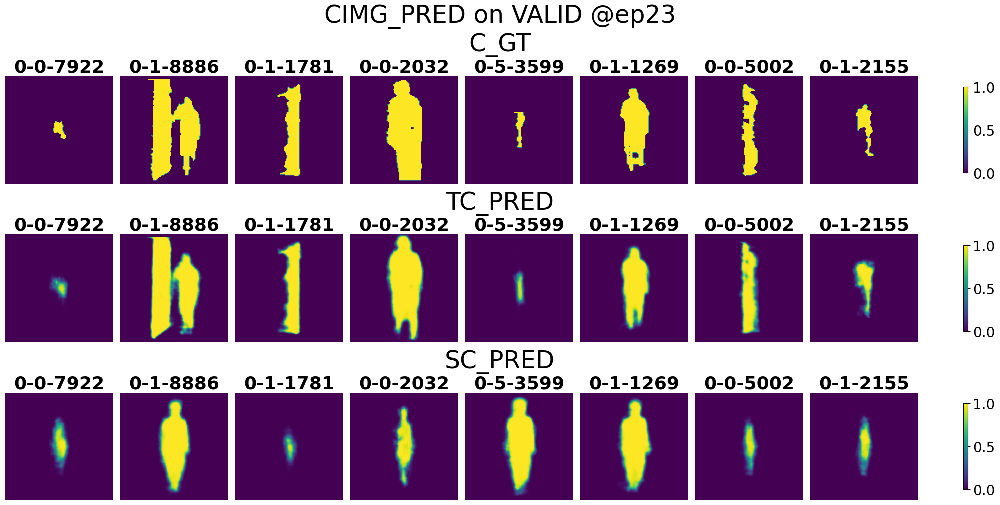

<Figure size 2000x1000 with 0 Axes>

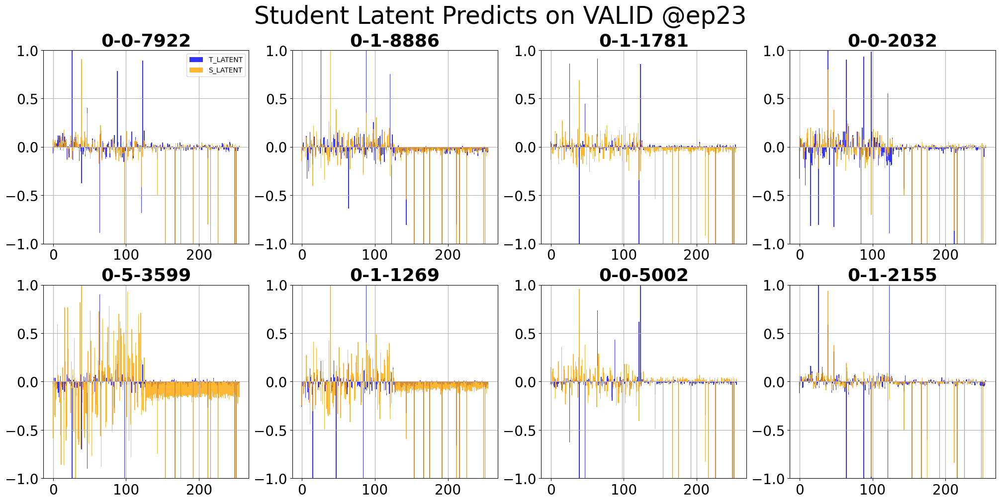

<Figure size 2000x1000 with 0 Axes>

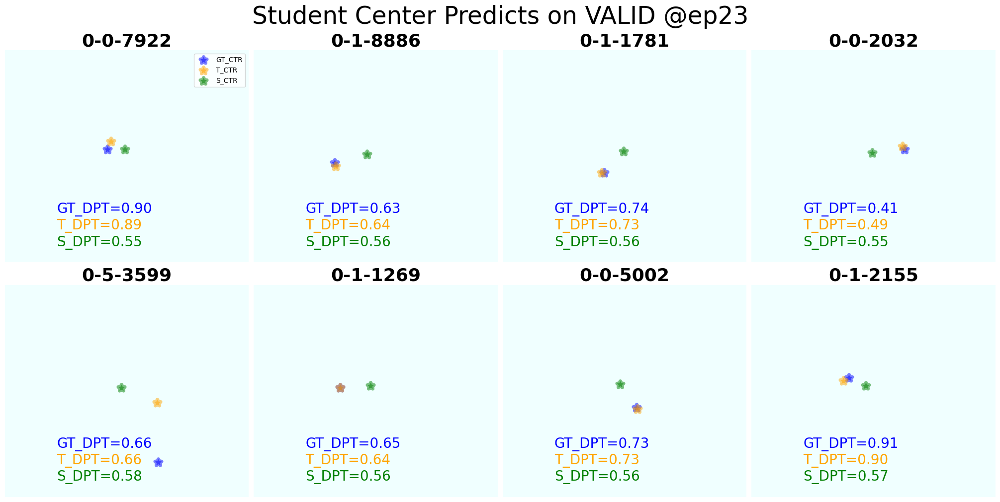

<Figure size 2000x1000 with 0 Axes>

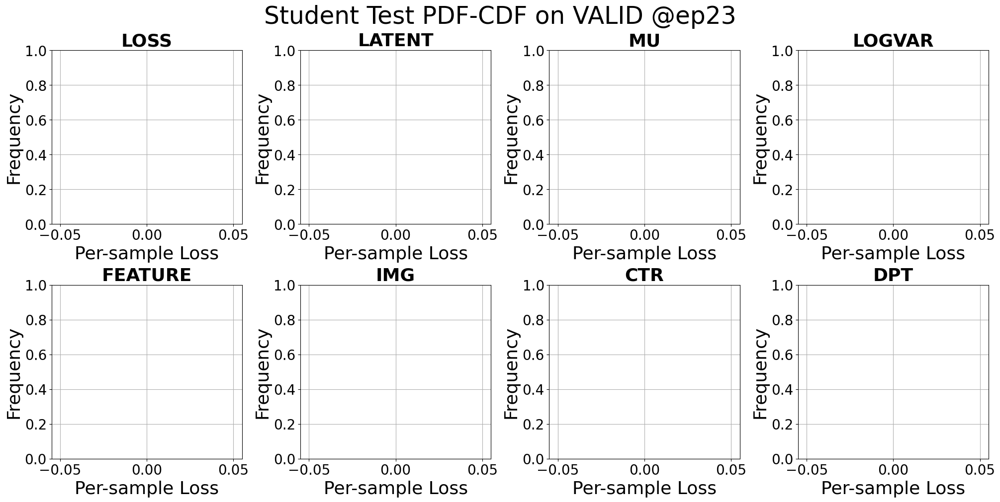

<Figure size 2000x1000 with 0 Axes>

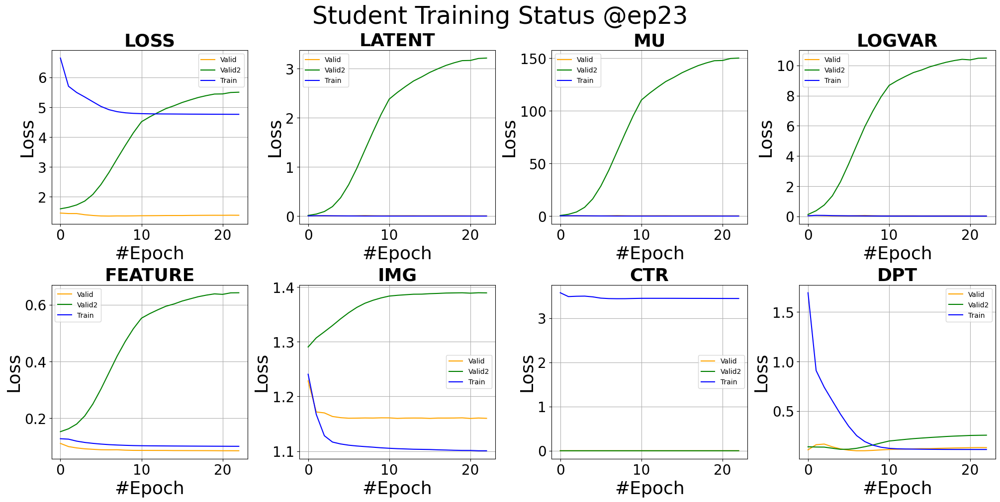

Saving models...
Saving imgen...
Saving cimgde...
Saving rimgde...
Saving ctrde...
Saving csien...
Saving main optimizer...
All saved!
Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 7 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 8 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 9 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 10 out of 10
Lr decay reporting: 3 out of 5. Decay rate = 0.125



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

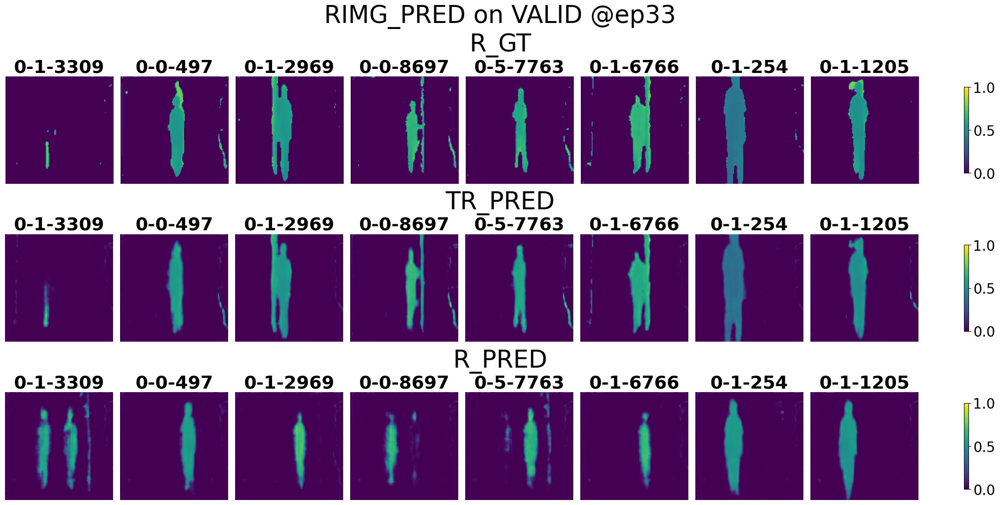

<Figure size 2000x1000 with 0 Axes>

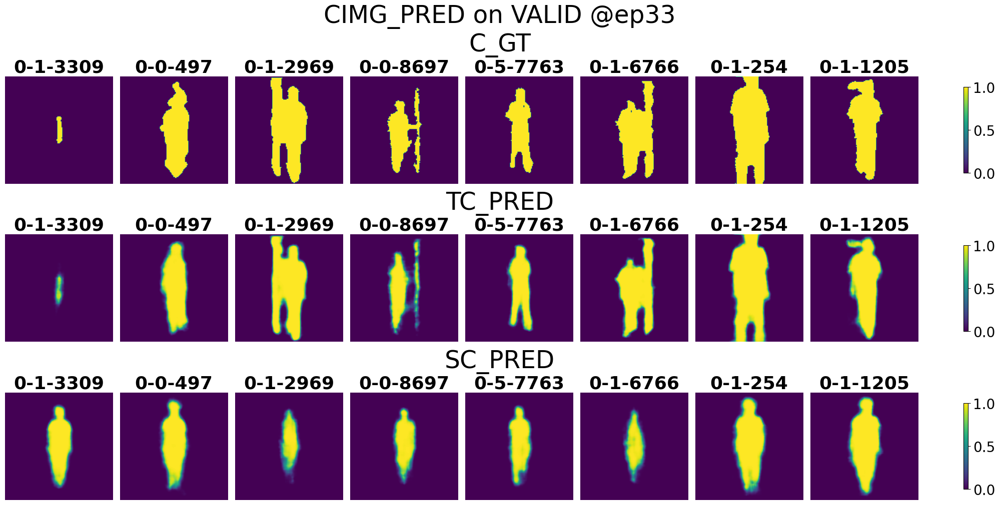

<Figure size 2000x1000 with 0 Axes>

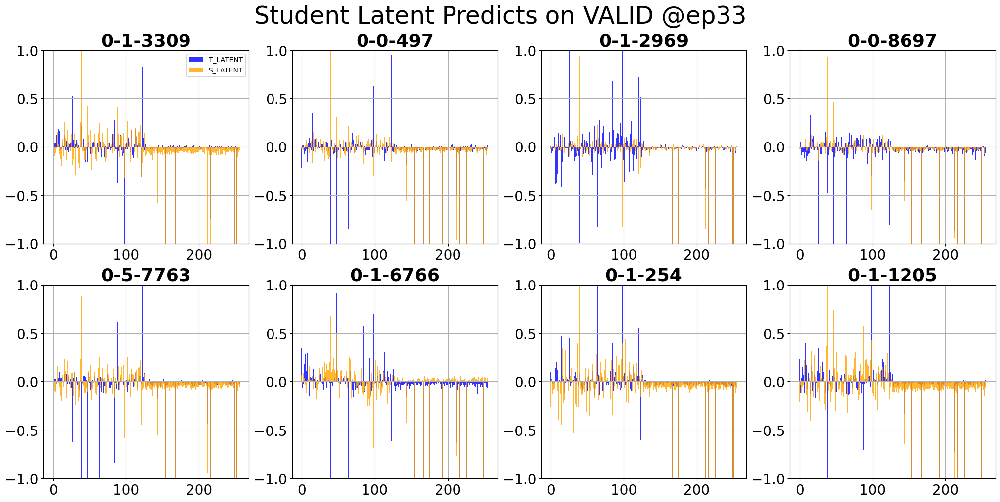

<Figure size 2000x1000 with 0 Axes>

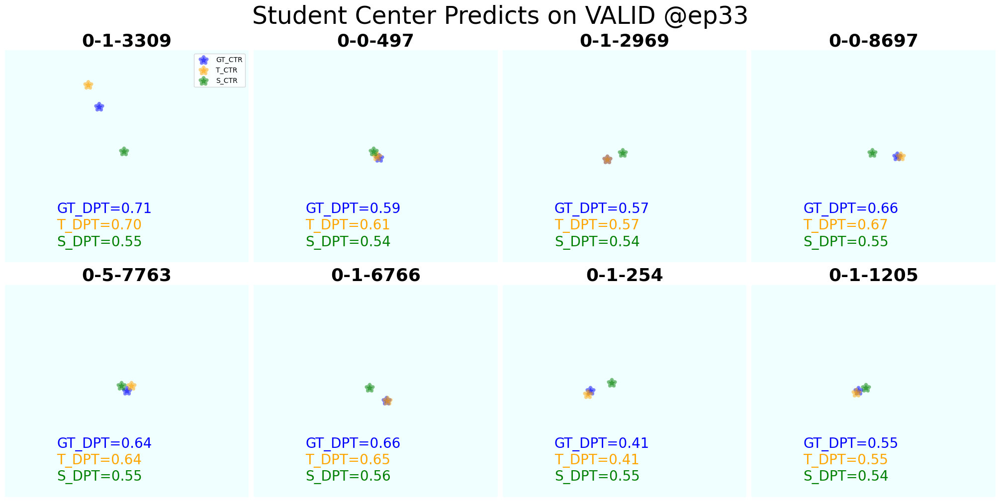

<Figure size 2000x1000 with 0 Axes>

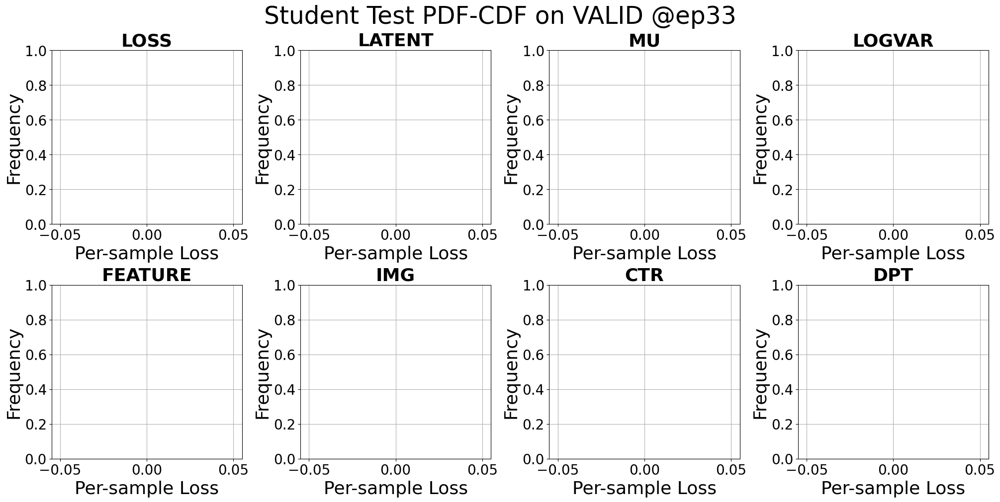

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

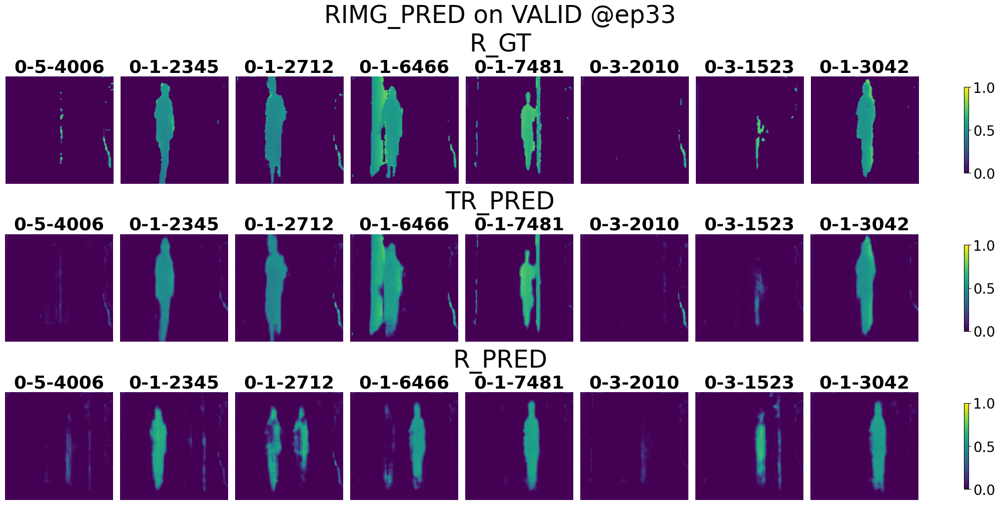

<Figure size 2000x1000 with 0 Axes>

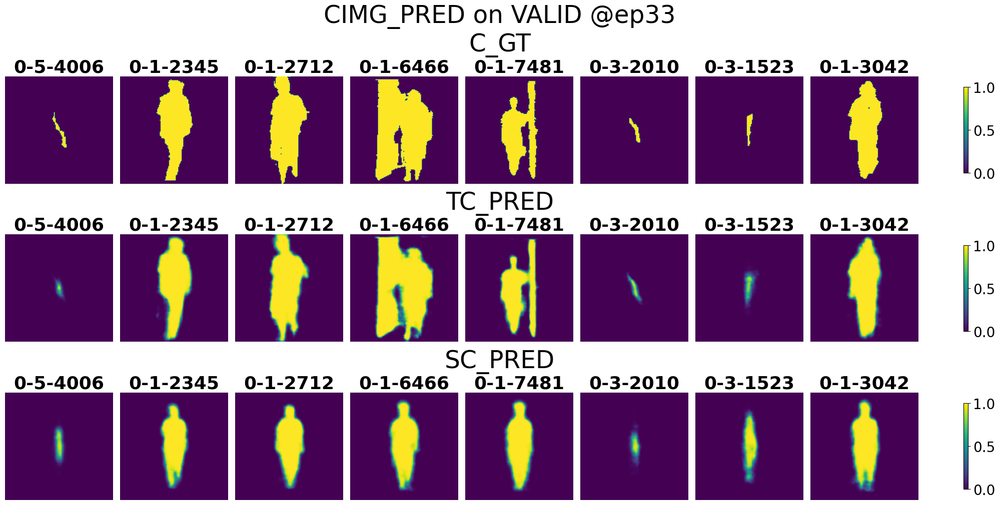

<Figure size 2000x1000 with 0 Axes>

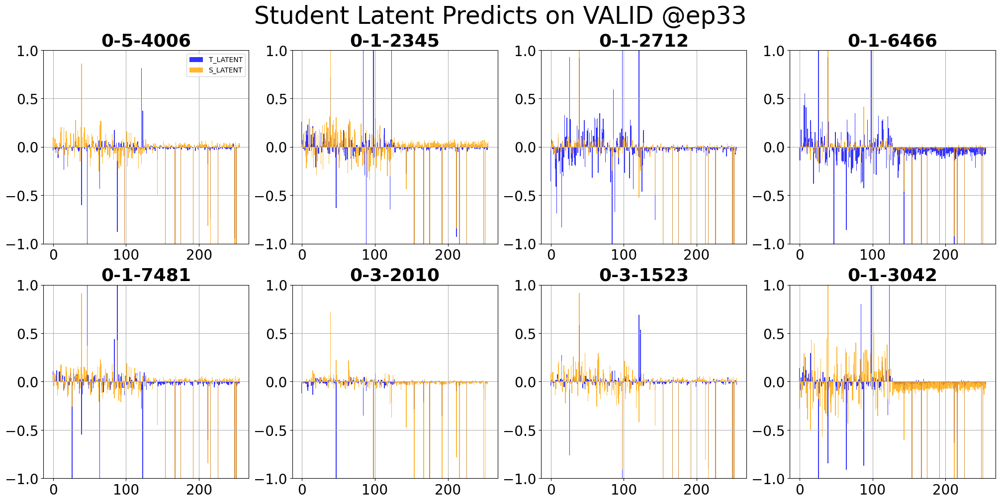

<Figure size 2000x1000 with 0 Axes>

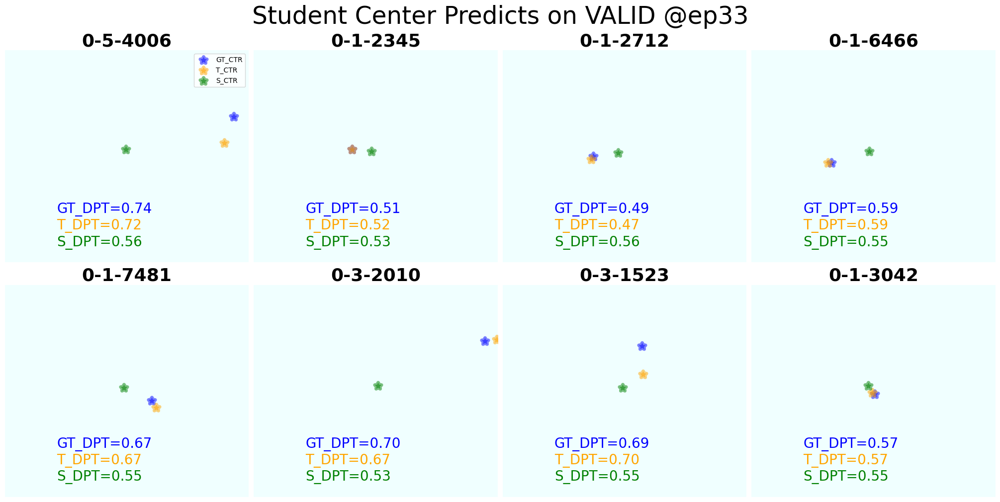

<Figure size 2000x1000 with 0 Axes>

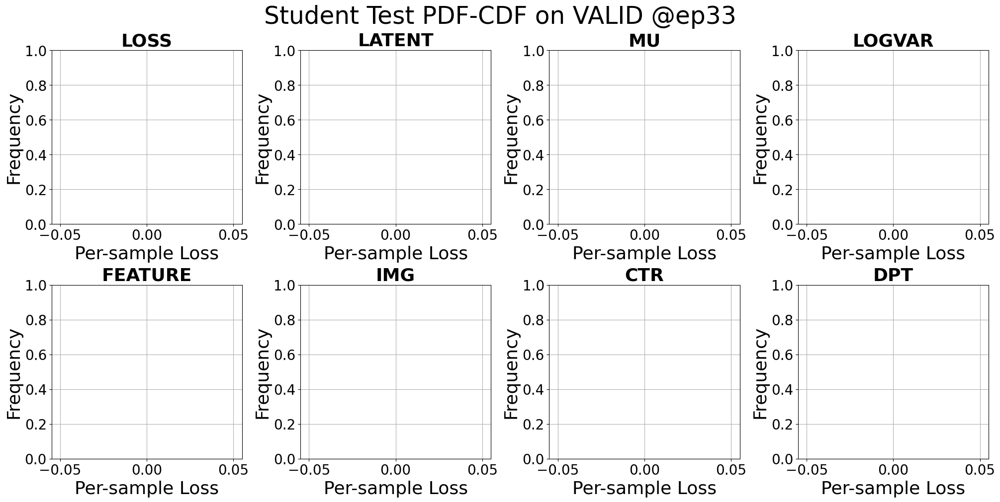

<Figure size 2000x1000 with 0 Axes>

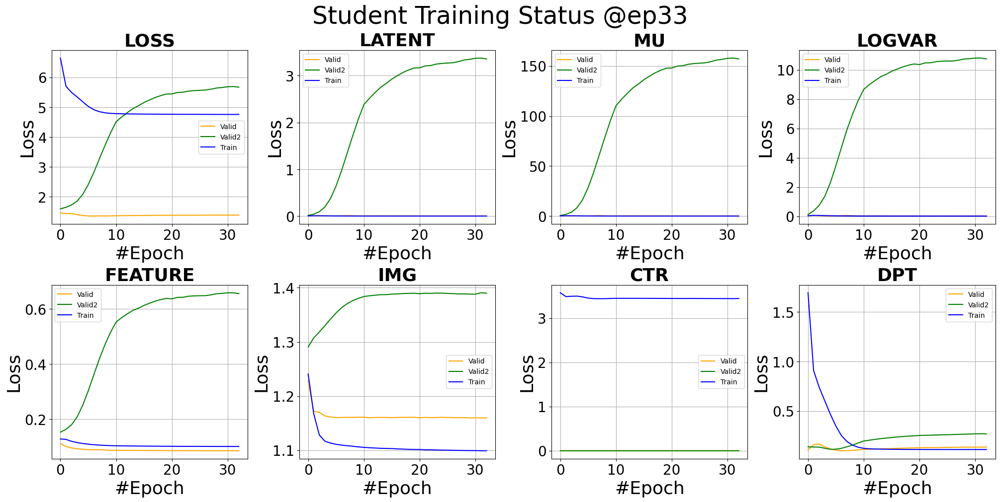

Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 7 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 8 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 9 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 10 out of 10
Lr decay reporting: 4 out of 5. Decay rate = 0.0625



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

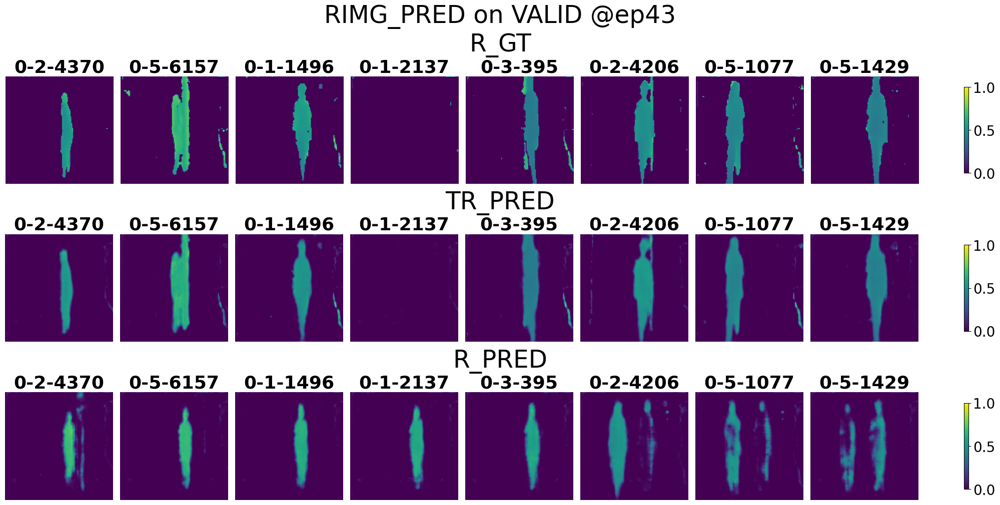

<Figure size 2000x1000 with 0 Axes>

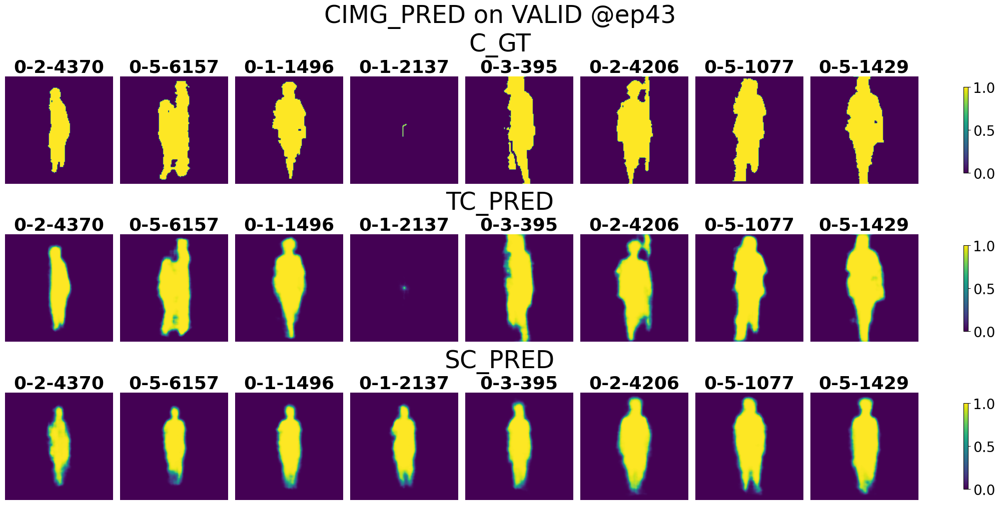

<Figure size 2000x1000 with 0 Axes>

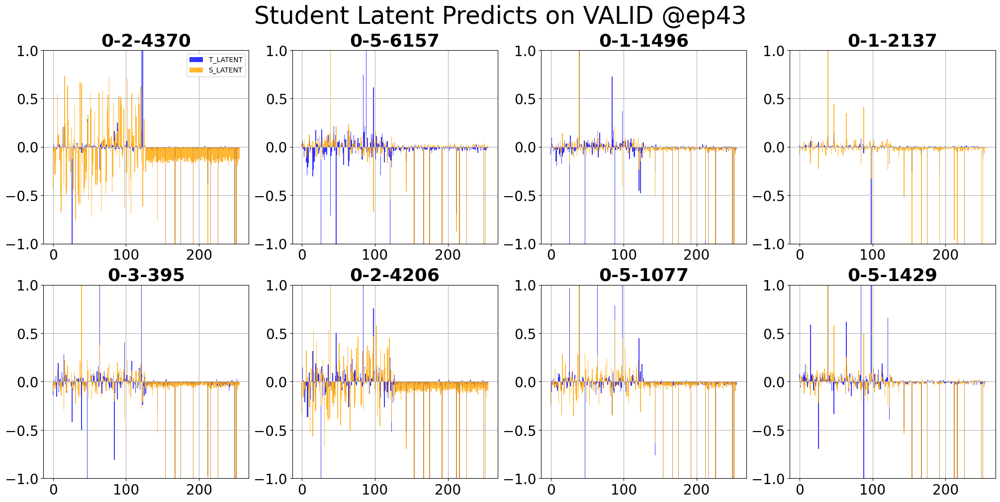

<Figure size 2000x1000 with 0 Axes>

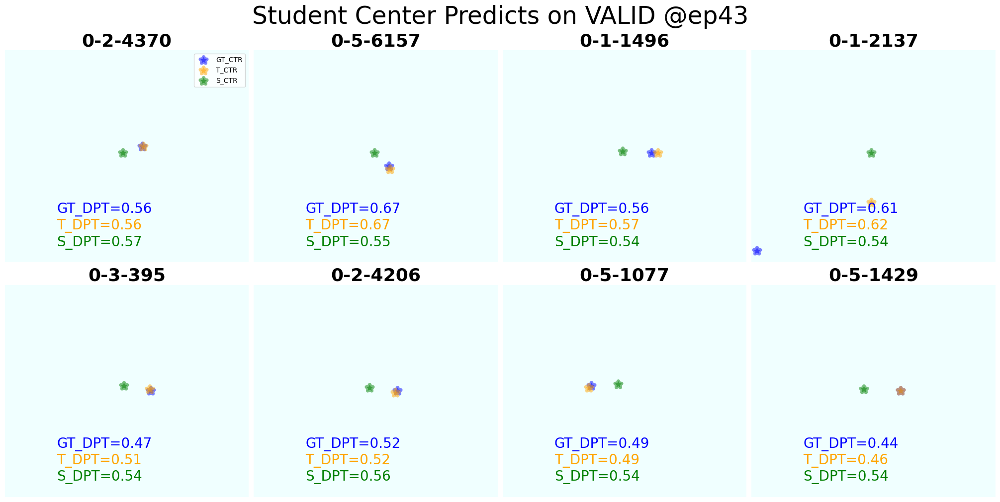

<Figure size 2000x1000 with 0 Axes>

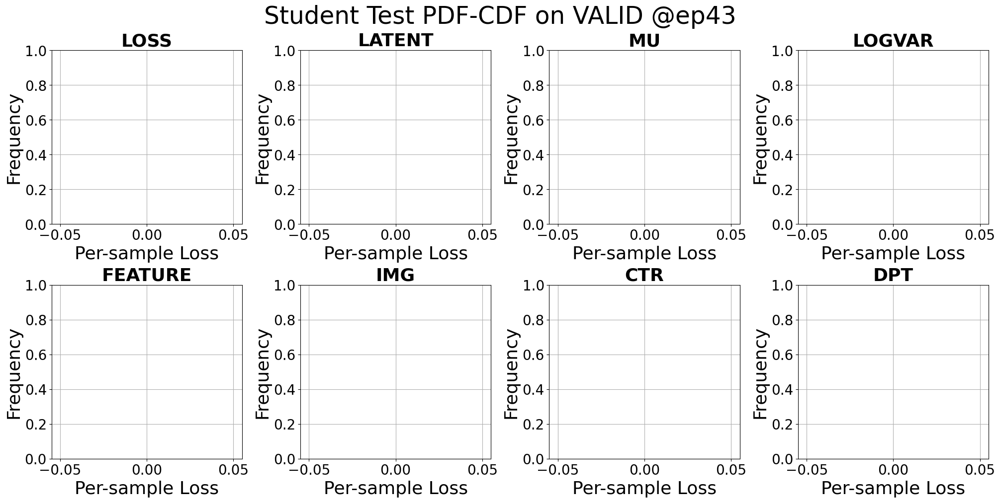

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

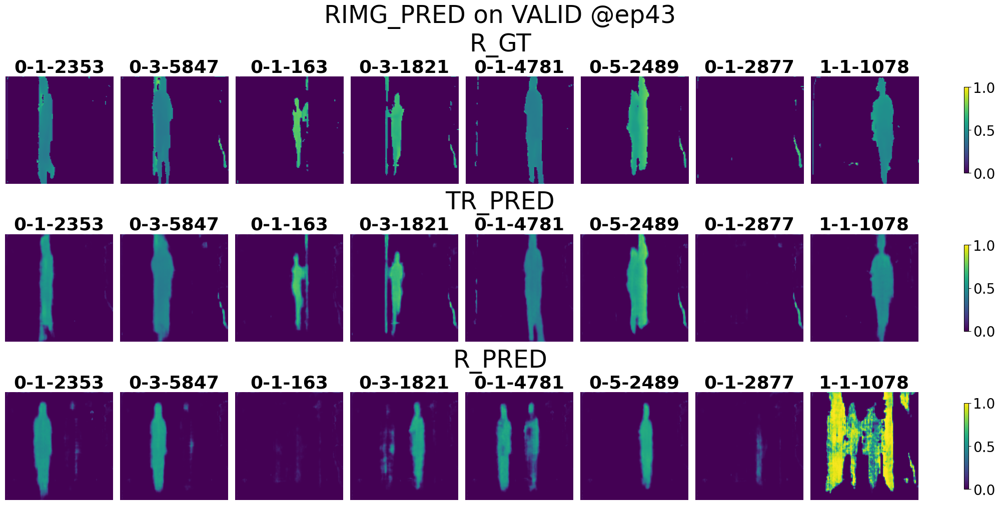

<Figure size 2000x1000 with 0 Axes>

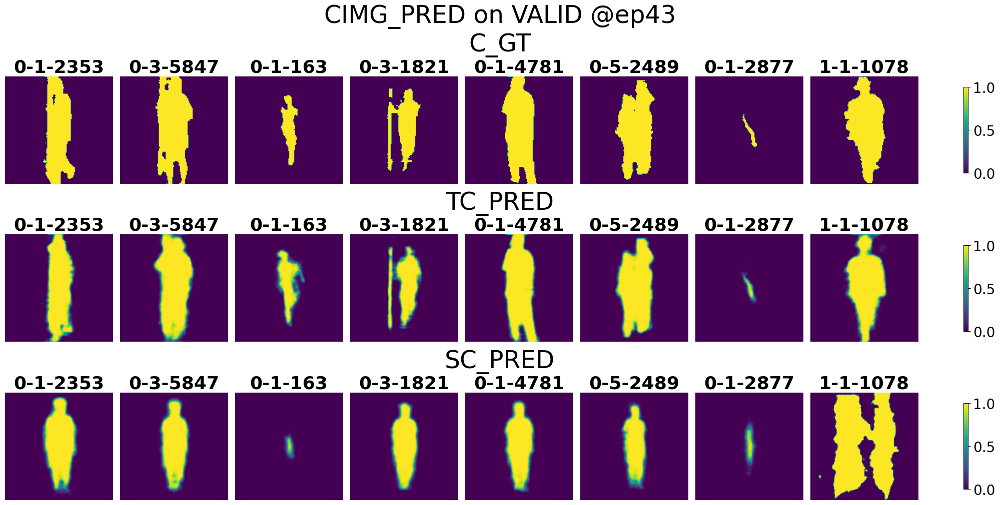

<Figure size 2000x1000 with 0 Axes>

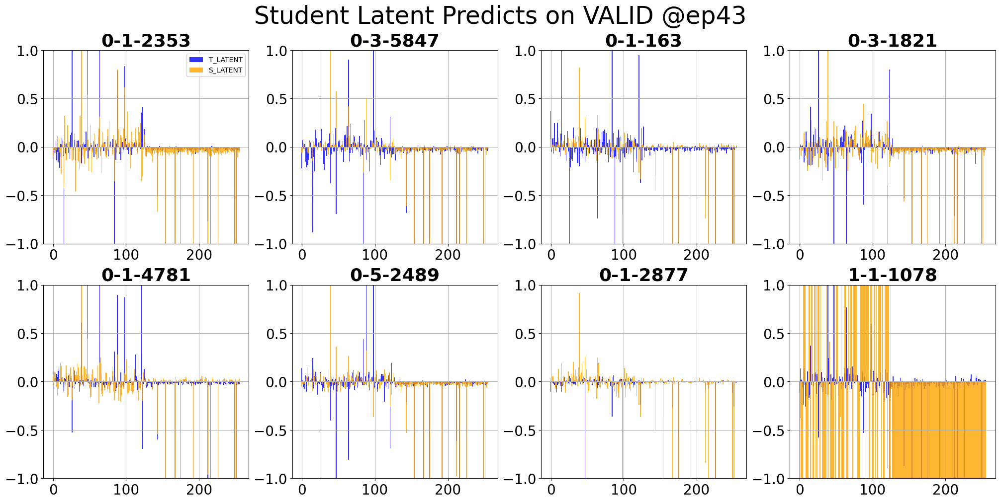

<Figure size 2000x1000 with 0 Axes>

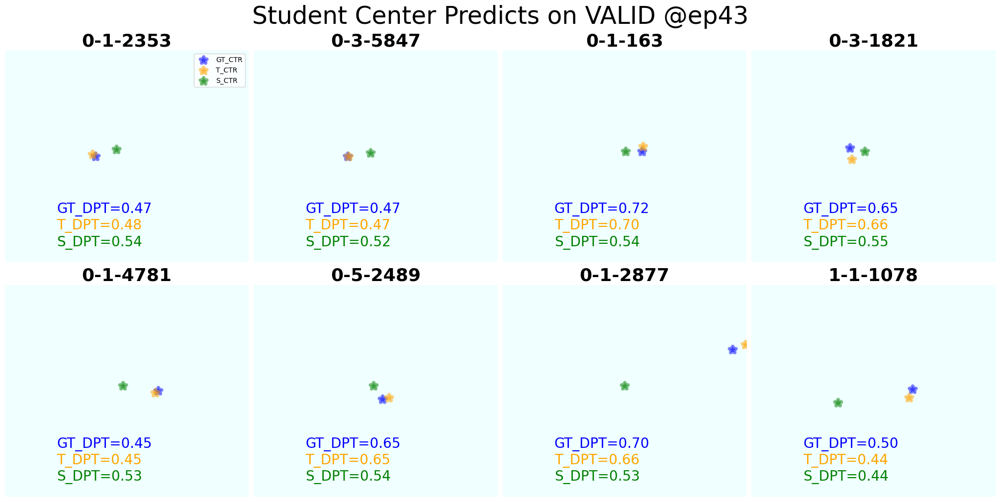

<Figure size 2000x1000 with 0 Axes>

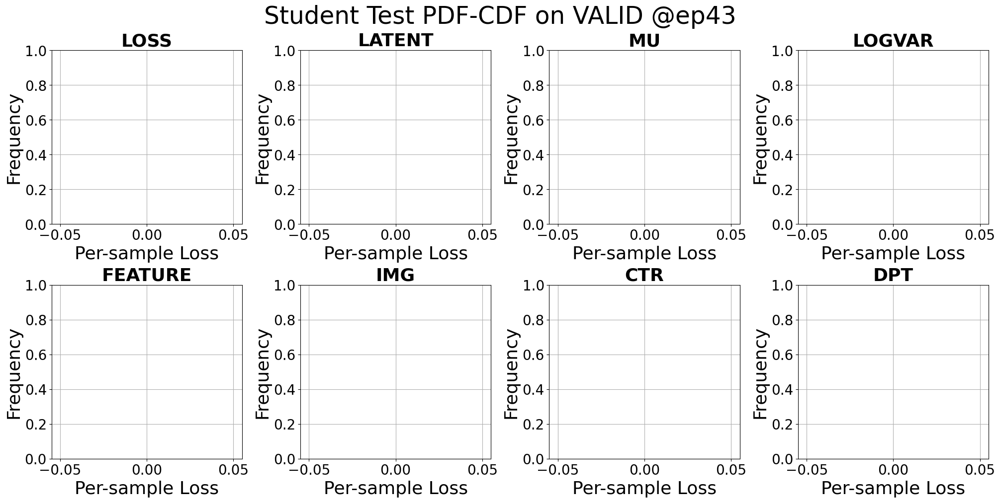

<Figure size 2000x1000 with 0 Axes>

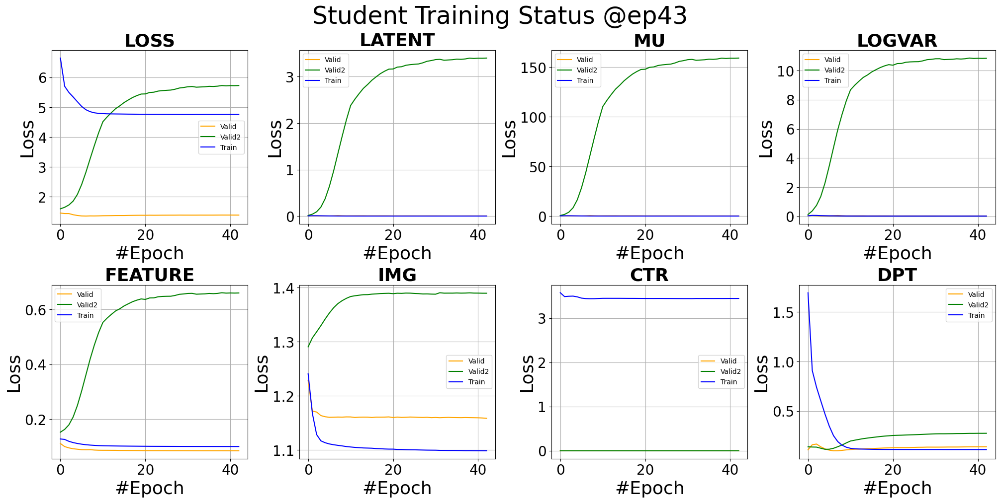

Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 7 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 8 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 9 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 10 out of 10
Lr decay reporting: 5 out of 5. Decay rate = 0.03125

Early Stopping triggered @ epoch 228
Saving models...
Saving imgen...
Saving cimgde...
Saving rimgde...
Saving ctrde...
Saving csien...
Saving main optimizer...
All saved!
train elapsed: 4481.751297950745 sec


<Figure size 2000x1000 with 0 Axes>

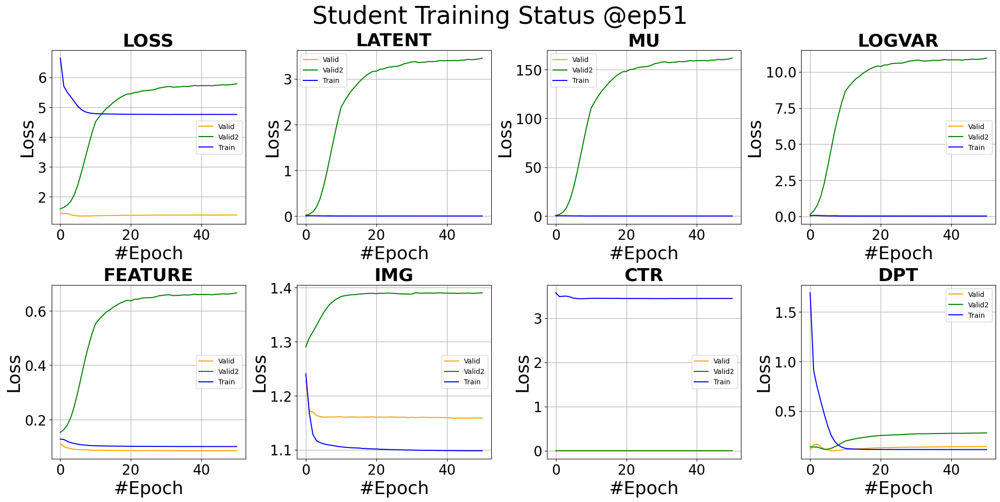

==========2025-02-19 18:27:48 2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T Student Test starting==========


  0%|                                                                                                         …


Test finished. Average loss={'LOSS': 5.39564265523638, 'LATENT': 0.0020933549219210234, 'MU': 0.08529809968812126, 'LOGVAR': 0.0193696489247183, 'FEATURE': 0.10047980167326473, 'IMG': 1.0975202918052673, 'CTR': 3.4461272841408137, 'DPT': 0.7494219129993802}
test elapsed: 32.49262285232544 sec


<Figure size 2000x1000 with 0 Axes>

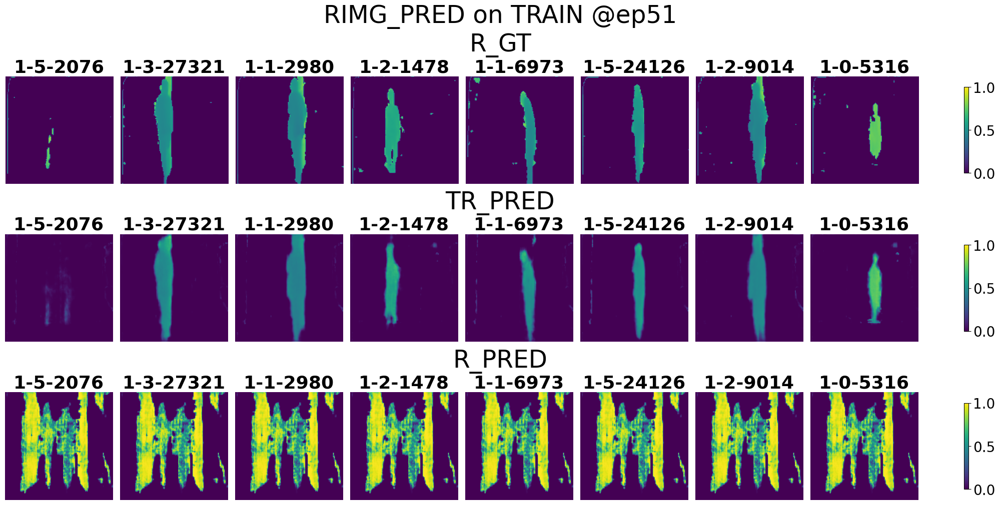

<Figure size 2000x1000 with 0 Axes>

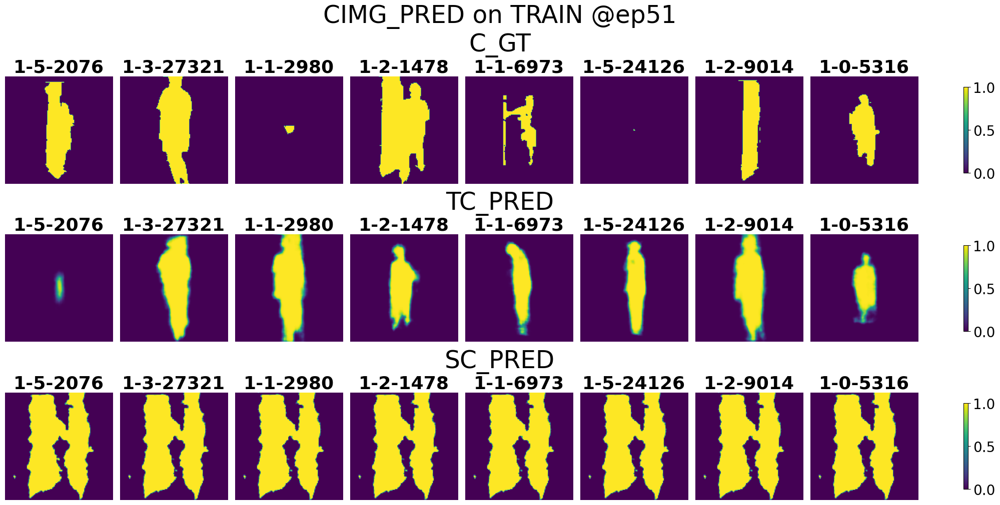

<Figure size 2000x1000 with 0 Axes>

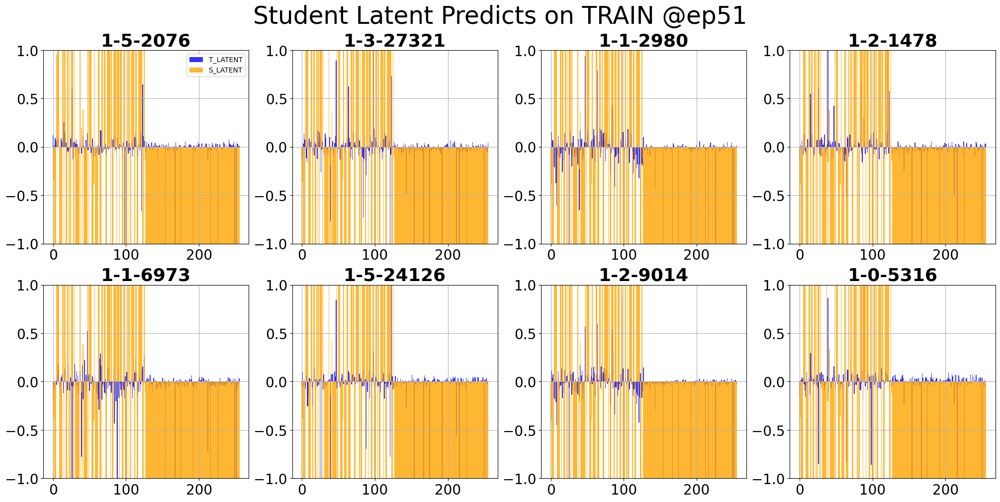

<Figure size 2000x1000 with 0 Axes>

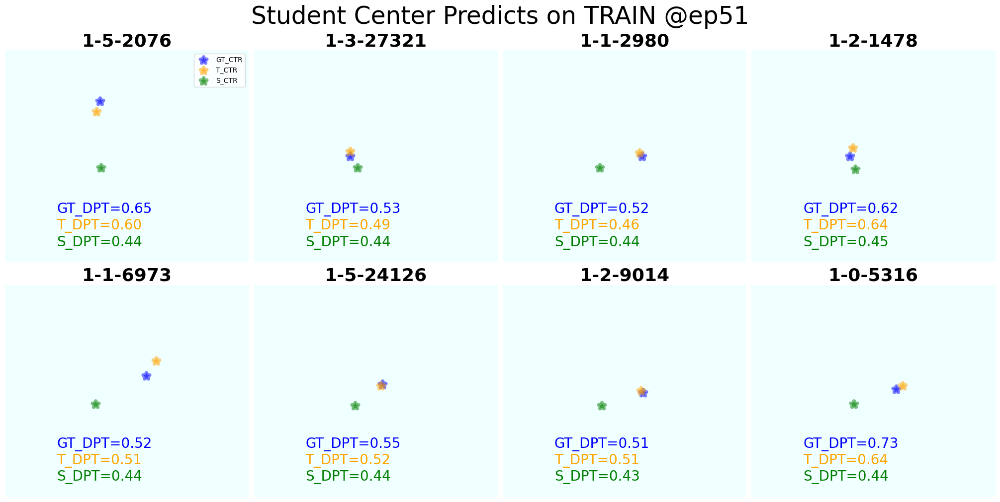

<Figure size 2000x1000 with 0 Axes>

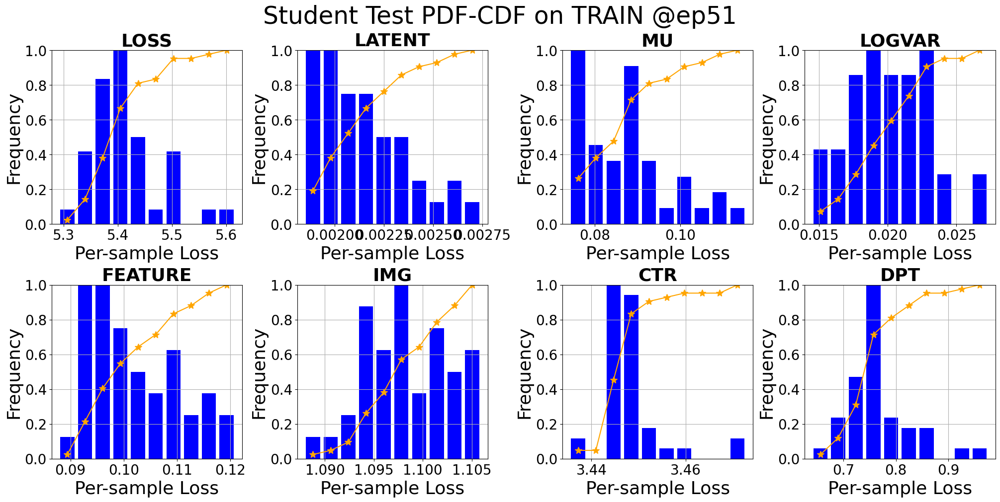

==========2025-02-19 18:28:41 2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T Student Test starting==========


  0%|                                                                                                         …


Test finished. Average loss={'LOSS': 5.799914812158655, 'LATENT': 3.457487369466711, 'MU': 161.9045255307798, 'LOGVAR': 10.969846909134477, 'FEATURE': 0.6699079089694553, 'IMG': 1.3904721463168108, 'CTR': 2.0034914147496844e-05, 'DPT': 0.2820273509731999}
test elapsed: 599.6906406879425 sec


<Figure size 2000x1000 with 0 Axes>

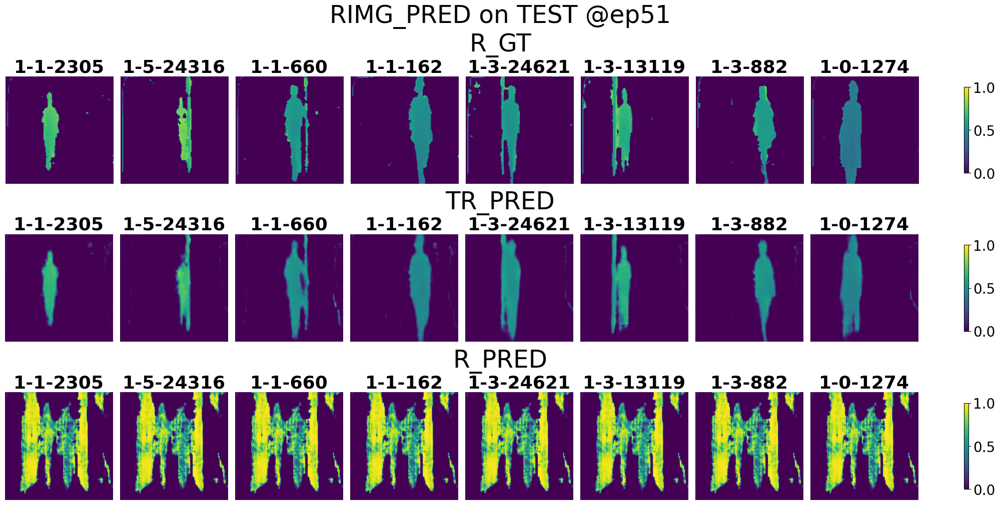

<Figure size 2000x1000 with 0 Axes>

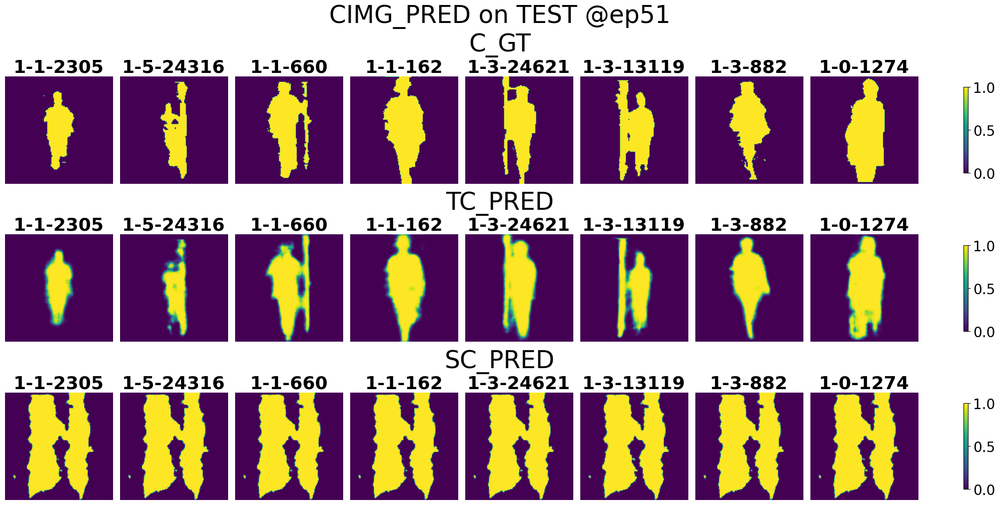

<Figure size 2000x1000 with 0 Axes>

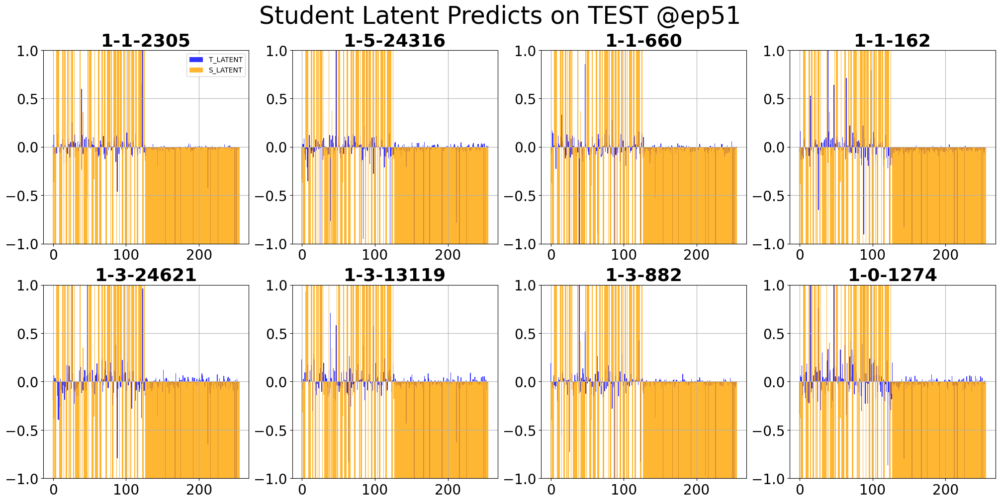

<Figure size 2000x1000 with 0 Axes>

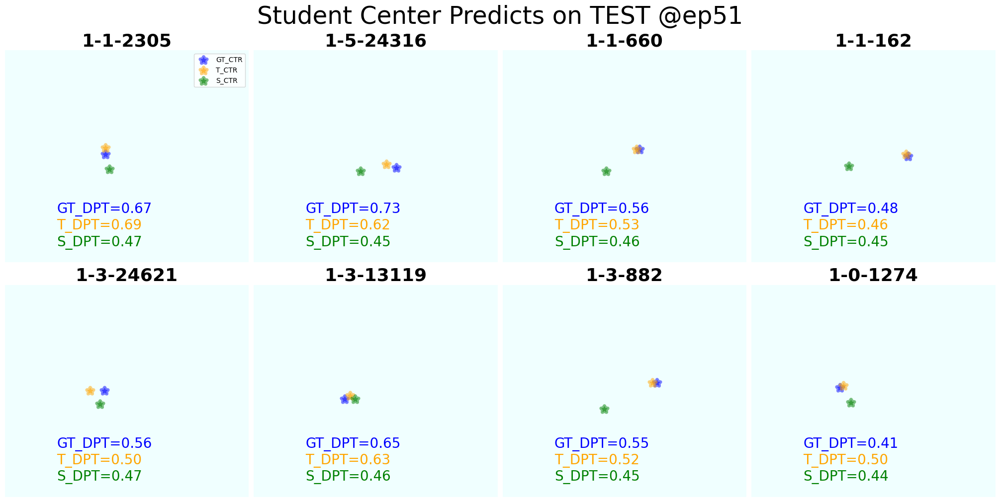

<Figure size 2000x1000 with 0 Axes>

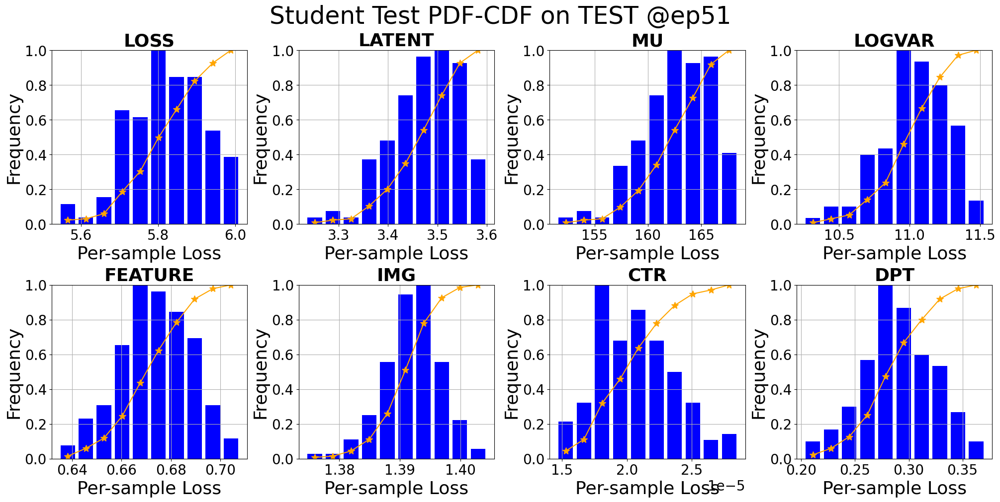

Saving preds: C_GT of len 8640...
Saving preds: R_GT of len 8640...
Saving preds: TR_PRED of len 8640...
Saving preds: R_PRED of len 8640...
Saving preds: TC_PRED of len 8640...
Saving preds: SC_PRED of len 8640...
Saving preds: T_LATENT of len 8640...
Saving preds: S_LATENT of len 8640...
Saving preds: GT_CTR of len 8640...
Saving preds: GT_DPT of len 8640...
Saving preds: T_CTR of len 8640...
Saving preds: T_DPT of len 8640...
Saving preds: S_CTR of len 8640...
Saving preds: S_DPT of len 8640...
Saving preds: TAG of len 8640...
Saving preds: IND of len 8640...
All saved!

Student schedule Completed!


In [5]:
name = f'{date}Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1'
preprocess = DS.Preprocess(new_size=(128, 128))
gpu = 0
torch.cuda.set_device(gpu)
S_trainer = StudentTrainer(name='Student',
                              epochs=10, cuda=gpu,
                              preprocess = preprocess,
                              notion=f'{name}_{current_test}',
                              dataloaders={
                                  'train': dann_train_loader,
                                  'valid': source_valid_loader,
                                  'valid2': target_valid_loader,
                                  'test': target_test_loader
                              },
                              adapting=True
                             )

S_trainer.latent_weight *= 0.001
S_trainer.load(f"../saved/2024_Door_RGB/Prop/Prop_TrainA208_None_4/", name='Student', mode='best')
S_trainer.schedule(lr_decay=True)

# Test

In [3]:
date = '2024_Door_RGB/Test/'
name = f'{date}Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1'
data_path = [
    '../dataset/Door_EXP/A308T',
            ]
level = 'env'

crossvalidator = DS.CrossValidator(level, all_range=['A308T'])
data_organizer = DS.DataOrganizer(name, data_path, crossvalidator)
data_organizer.load()

Cross validation plan at env level
Loading ../dataset/Door_EXP/A308T...

Loaded 0731D00-csi.npy
Loaded 0731D00-pd.npy
Loaded 0731D10-csi.npy
Loaded 0731D10-pd.npy
Loaded 0731D20-csi.npy
Loaded 0731D20-pd.npy
Loaded 0731D21-csi.npy
Loaded 0731D21-pd.npy
Loaded 0731D30-csi.npy
Loaded 0731D30-pd.npy
Loaded 0731D40-csi.npy
Loaded 0731D40-pd.npy
Loaded 0731D50-csi.npy
Loaded 0731D50-pd.npy
Loaded 20240731_131758-cimg.npy
Loaded 20240731_131758-ctr.npy
Loaded 20240731_131758-dpt.npy
Loaded 20240731_131758-rimg.npy
Loaded 20240731_132041-cimg.npy
Loaded 20240731_132041-ctr.npy
Loaded 20240731_132041-dpt.npy
Loaded 20240731_132041-rimg.npy
Loaded 20240731_132526-cimg.npy
Loaded 20240731_132526-ctr.npy
Loaded 20240731_132526-dpt.npy
Loaded 20240731_132526-rimg.npy
Loaded 20240731_132913-cimg.npy
Loaded 20240731_132913-ctr.npy
Loaded 20240731_132913-dpt.npy
Loaded 20240731_132913-rimg.npy
Loaded 20240731_134148-cimg.npy
Loaded 20240731_134148-ctr.npy
Loaded 20240731_134148-dpt.npy
Loaded 2024073

In [4]:
data_organizer.gen_plan()
target_train_loader, target_valid_loader, target_test_loader, current_test = data_organizer.gen_loaders(num_workers=2)

Cross-validator: Fetched level env, 1 of 1, current test = A308T
 Select set range = [], len = 0
 Leave set range = A308T, len = 43412
Data Organizer: Generating loaders for s: current test = A308T
 Train/Valid dataset length = 0
 Test dataset length = 43412
 None train loader
 None valid loader
 Exported test loader of len 678, batch size = 64



==========2024_Door_RGB/Test/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T Student Loading==========
Loading ../saved/2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T/
Loaded model imgen at epoch 51 from ../saved/2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T/Student_models_imgen_best.pth!
Loaded model cimgde at epoch 51 from ../saved/2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T/Student_models_cimgde_best.pth!
Loaded model rimgde at epoch 51 from ../saved/2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T/Student_models_rimgde_best.pth!
Loaded model ctrde at epoch 51 from ../saved/2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T/Student_models_ctrde_best.pth!
Loaded model csien at epoch 51 from ../saved/2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T/Student_models_csien_best.pth!
==

  0%|                                                                                                         …


Test finished. Average loss={'LOSS': 3447.686374000392, 'LATENT': 3445.344798940473, 'MU': 161.33208402560524, 'LOGVAR': 10.935156062640974, 'FEATURE': 0.6671872882716423, 'IMG': 1.3908116761210394, 'CTR': 2.0031661115072224e-05, 'DPT': 0.28357142179237355}
test elapsed: 914.6741192340851 sec


<Figure size 640x480 with 0 Axes>

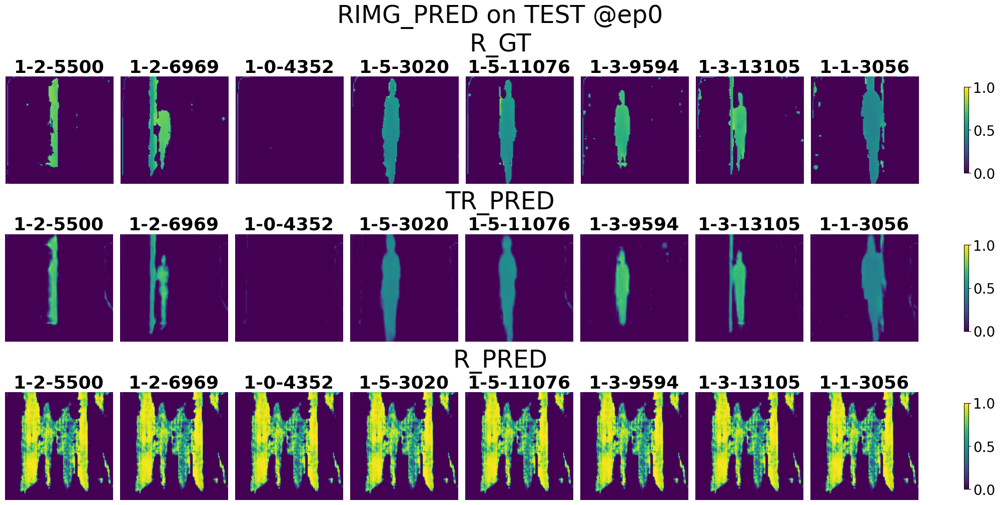

<Figure size 2000x1000 with 0 Axes>

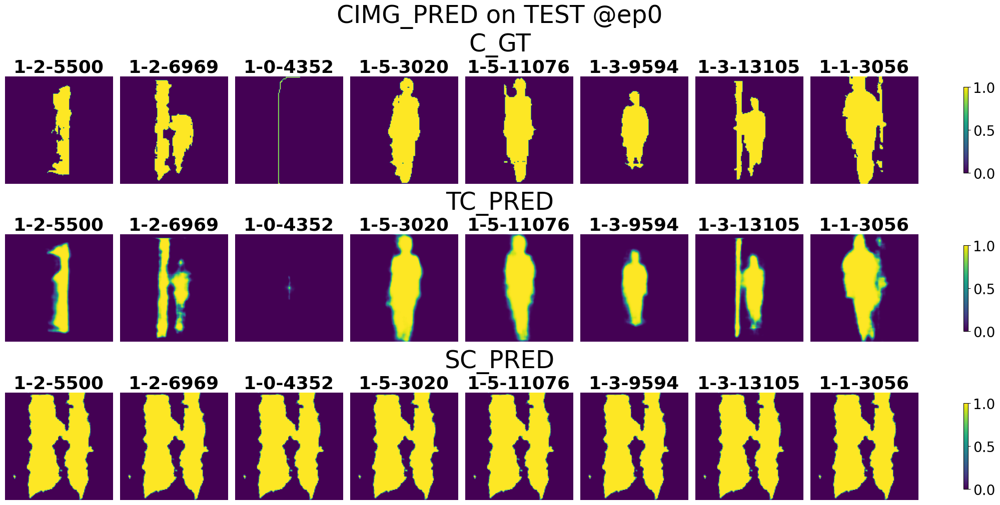

<Figure size 2000x1000 with 0 Axes>

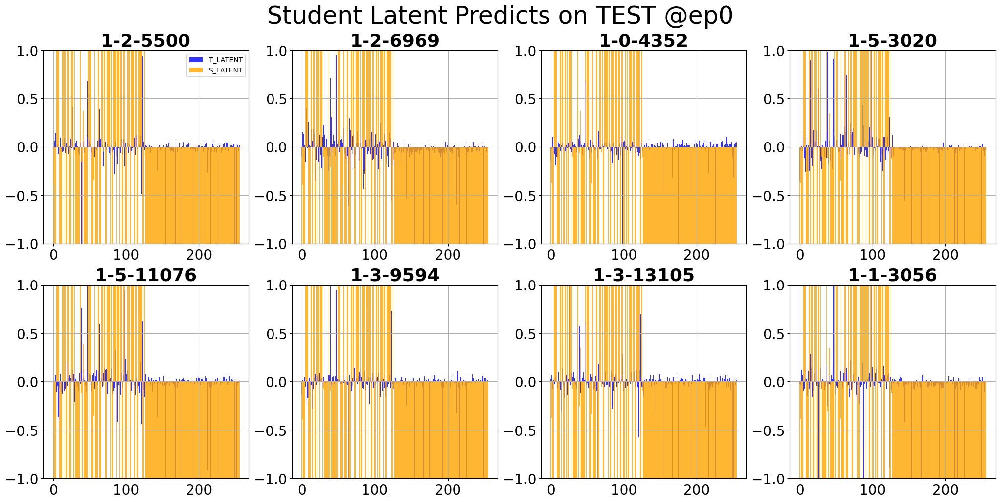

<Figure size 2000x1000 with 0 Axes>

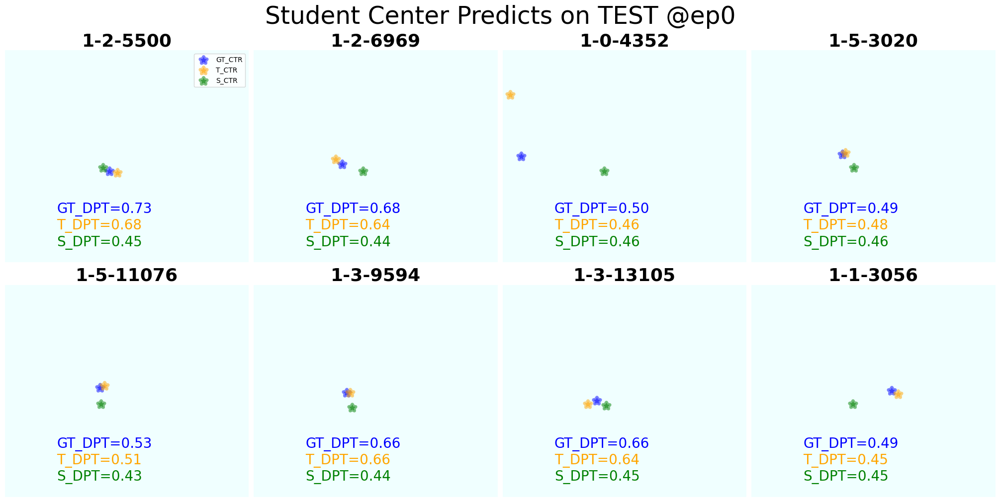

<Figure size 2000x1000 with 0 Axes>

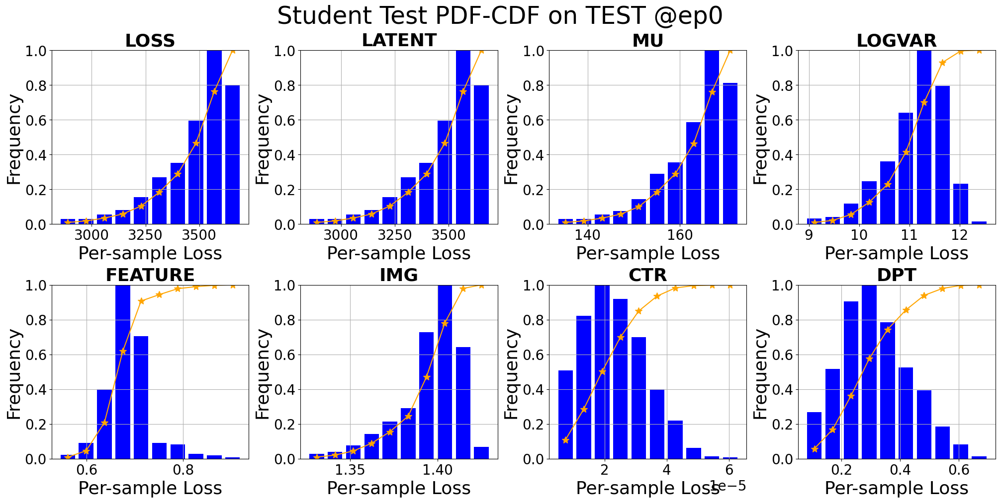

Saving preds: C_GT of len 43392...
Saving preds: R_GT of len 43392...
Saving preds: TR_PRED of len 43392...
Saving preds: R_PRED of len 43392...
Saving preds: TC_PRED of len 43392...
Saving preds: SC_PRED of len 43392...
Saving preds: T_LATENT of len 43392...
Saving preds: S_LATENT of len 43392...
Saving preds: GT_CTR of len 43392...
Saving preds: GT_DPT of len 43392...
Saving preds: T_CTR of len 43392...
Saving preds: T_DPT of len 43392...
Saving preds: S_CTR of len 43392...
Saving preds: S_DPT of len 43392...
Saving preds: TAG of len 43392...
Saving preds: IND of len 43392...
All saved!


In [5]:
preprocess = DS.Preprocess(new_size=(128, 128))
gpu = 0
torch.cuda.set_device(gpu)
S_trainer = TP.StudentTrainer(name='Student',
                              epochs=10, cuda=gpu,
                              preprocess = preprocess,
                              notion=f'{name}_{current_test}',
                              dataloaders={
                                  'test': target_test_loader
                              },
                              # adapting=True
                             )

S_trainer.load(f"../saved/2024_Door_RGB/Prop/Prop_TrainA208TargetA308_scfeature_sclatent_postloss_1_A308T/", name='Student', mode='best')
S_trainer.test(loader='test')
S_trainer.plot_test(autosave=True)
S_trainer.losslog.save('preds', S_trainer.save_path)